<a href="https://colab.research.google.com/github/Leanse1/Object-Detection---SImple-Projects/blob/main/Image_and_Video_Detection_using_YOLONAS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Image and Video segmentation using YOLO-NAS**

#**Step 01: Install All the Required Packages**

In [ ]:
!pip install -q super_gradients  # YOLO-NAS packages
!pip install -q segment_anything
!pip install -q supervision

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.0/12.0 MB 25.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.8/135.8 kB 11.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 38.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 47.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 52.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 408.6/408.6 kB 37.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 18.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 51.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 70.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.0/68.0 kB 7.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to b

#**🚨 Restart the Run Time**

#**Step 02:Import All the Required Libraries**

In [ ]:
import cv2
import torch
import math
import numpy as np
from numpy import random
import supervision as sv
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from super_gradients.training import models
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

The console stream is logged into /root/sg_logs/console.log


[2023-11-27 11:41:21] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it
[2023-11-27 11:41:21] WARNING - __init__.py - Failed to import pytorch_quantization
[2023-11-27 11:41:21] INFO - utils.py - NumExpr defaulting to 2 threads.
[2023-11-27 11:41:29] WARNING - calibrator.py - Failed to import pytorch_quantization
[2023-11-27 11:41:29] WARNING - export.py - Failed to import pytorch_quantization
[2023-11-27 11:41:29] WARNING - selective_quantization_utils.py - Failed to import pytorch_quantization
[2023-11-27 11:41:29] WARNING - env_sanity_check.py - Failed to verify installed packages: boto3 required but not found
[2023-11-27 11:41:29] WARNING - env_sanity_check.py - Failed to verify installed packages: deprecated required but not found
[2023-11-27 11:41:29] WARNING - env_sanity_check.py - Failed to verify installed packages: coverage required but not found
[2023-11-27 11:41:29] WARNING - env_sanity_check.py - 

#**Step 03: Download Some Demo Videos From Drive into the Google Colab Notebook**

In [ ]:
!gdown "https://drive.google.com/uc?id=1XGUjQpdjDmWlH4g4FlamBQXJSbMAXl81"
!gdown "https://drive.google.com/uc?id=1KXNa8R6DoVlLPbIaoEjMl4xyxwYYPLd4"
!gdown "https://drive.google.com/uc?id=1Cw005Th3-Cudjo_3S6ji4Zz5GMllMXgb"

Downloading...
From: https://drive.google.com/uc?id=1XGUjQpdjDmWlH4g4FlamBQXJSbMAXl81
To: /content/carvideo.mp4
100% 951k/951k [00:00<00:00, 125MB/s]
Downloading...
From: https://drive.google.com/uc?id=1KXNa8R6DoVlLPbIaoEjMl4xyxwYYPLd4
To: /content/DrpoedShot.mp4
100% 6.86M/6.86M [00:00<00:00, 95.9MB/s]
Downloading...
From: https://drive.google.com/uc?id=1Cw005Th3-Cudjo_3S6ji4Zz5GMllMXgb
To: /content/Basketball_video.mp4
100% 7.85M/7.85M [00:00<00:00, 96.0MB/s]


#**Step 04: Load the Input Video and calculate the Frame Width and Frame Height**

In [ ]:
cap=cv2.VideoCapture("/content/Basketball_video.mp4")
frame_width=int(cap.get(3))
frame_height=int(cap.get(4))

#**Step 05: Download the Pre-Trained YOLO-NAS Model Weights**

In [ ]:
device = torch.device("cuda:0") if torch.cuda.is_available() else torch.device("cpu")
model = models.get('yolo_nas_s', pretrained_weights="coco").to(device)

[2023-11-27 11:43:45] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_s_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_s_coco.pth
100%|██████████| 73.1M/73.1M [00:00<00:00, 211MB/s]
[2023-11-27 11:43:46] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_s


#**Step 06: Object Detection with YOLO-NAS**

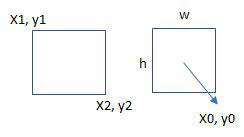

In [ ]:
names = ["person", "bicycle", "car", "motorbike", "aeroplane", "bus", "train", "truck", "boat", "traffic light", "fire hydrant", "stop sign", "parking meter", "bench", "bird", "cat", "dog", "horse", "sheep", "cow", "elephant", "bear", "zebra", "giraffe", "backpack", "umbrella","handbag", "tie", "suitcase", "frisbee", "skis", "snowboard", "sports ball", "kite", "baseball bat","baseball glove", "skateboard", "surfboard", "tennis racket", "bottle", "wine glass", "cup","fork", "knife", "spoon", "bowl", "banana", "apple", "sandwich", "orange", "broccoli","carrot", "hot dog", "pizza", "donut", "cake", "chair", "sofa", "pottedplant", "bed","diningtable", "toilet", "tvmonitor", "laptop", "mouse", "remote", "keyboard", "cell phone","microwave", "oven", "toaster", "sink", "refrigerator", "book", "clock", "vase", "scissors","teddy bear", "hair drier", "toothbrush" ]
out = cv2.VideoWriter('Output1.avi', cv2.VideoWriter_fourcc('M', 'J', 'P', 'G'), 10, (frame_width, frame_height))
frame_count = 0
while True:
    ret, frame = cap.read()
    frame_count += 1
    if ret:
        # Object Detection and Annotation Code
        result = list(model.predict(frame, conf=0.35))[0]  # sort highest prediction
        bbox_xyxys = result.prediction.bboxes_xyxy.tolist()  # bounding box tensor type to list
        confidences = result.prediction.confidence   # list of confidence scores
        labels = result.prediction.labels.tolist()    # index of names dataset
        for (bbox_xyxy, confidence, cls) in zip(bbox_xyxys, confidences, labels):   # loop to iterate over bbox, confidence, labels
            bbox = np.array(bbox_xyxy)  # Converts the bounding box coordinates from the list format (bbox_xyxy) to a NumPy array (bbox) for easier manipulation.
            x1, y1, x2, y2 = bbox[0], bbox[1], bbox[2], bbox[3]
            x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)   # to convert pixel coordinate to whole numbers
            classname = int(cls)
            class_name = names[classname]    # get names
            conf = math.ceil((confidence*100))/100    # rounds confidence number to 2 decimal places
            label = f'{class_name}{conf}'              # class name and confidence
            print("Frame N", frame_count, "", x1, y1,x2, y2)    #  frame number and bounding box coordinates.
            t_size = cv2.getTextSize(label, 0, fontScale = 1, thickness=2)[0] # gives width and height of label text;
            c2 = x1 + t_size[0], y1 - t_size[1] -3     # draws label over bounding box
            cv2.rectangle(frame, (x1, y1), c2, [255, 144, 30], -1, cv2.LINE_AA)    # rectangle for label
            cv2.putText(frame, label, (x1, y1-2), 0, 1, [255, 255, 255], thickness=1, lineType = cv2.LINE_AA)
            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 255), 3)
            resize_frame = cv2.resize(frame, (0, 0), fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)
        out.write(frame)
    else:
        break

out.release()
cap.release()

[2023-11-27 07:59:57] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2023-11-27 08:00:04] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 1  1010 402 1202 716
Frame N 1  980 340 1080 565
Frame N 1  557 326 709 677
Frame N 1  684 291 834 685
Frame N 1  882 387 973 612
Frame N 1  311 286 455 665
Frame N 1  13 382 106 593
Frame N 1  97 397 187 600
Frame N 1  969 150 1066 386
Frame N 1  486 205 565 312
Frame N 1  849 257 941 451
Frame N 1  791 372 926 615
Frame N 1  850 258 941 386
Frame N 1  176 396 328 605
Frame N 1  563 203 630 309


[2023-11-27 08:00:05] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 2  296 247 419 669
Frame N 2  978 337 1081 566
Frame N 2  1007 401 1206 716
Frame N 2  873 386 971 613
Frame N 2  558 330 699 674
Frame N 2  160 391 315 606
Frame N 2  845 251 938 448
Frame N 2  968 135 1064 383
Frame N 2  1 375 88 594
Frame N 2  667 287 828 690
Frame N 2  475 322 560 599
Frame N 2  83 390 172 606
Frame N 2  788 371 866 476
Frame N 2  391 332 486 593
Frame N 2  476 198 555 305
Frame N 2  202 240 288 338
Frame N 2  553 198 622 305
Frame N 2  777 307 850 403


[2023-11-27 08:00:05] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 3  1003 400 1185 716
Frame N 3  977 333 1082 581
Frame N 3  236 244 423 675
Frame N 3  661 274 816 687
Frame N 3  873 381 967 613
Frame N 3  531 330 687 674
Frame N 3  840 247 933 373
Frame N 3  962 143 1063 384
Frame N 3  0 371 73 596
Frame N 3  142 386 301 607
Frame N 3  56 387 155 604
Frame N 3  769 299 847 404
Frame N 3  462 311 552 600
Frame N 3  464 193 547 306
Frame N 3  374 327 476 589
Frame N 3  1074 261 1180 506
Frame N 3  1166 335 1244 504
Frame N 3  187 238 274 331
Frame N 3  1220 401 1281 533


[2023-11-27 08:00:05] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 4  1001 401 1185 716
Frame N 4  970 331 1079 568
Frame N 4  244 233 396 671
Frame N 4  861 383 962 612
Frame N 4  130 383 290 607
Frame N 4  659 274 800 685
Frame N 4  832 242 930 389
Frame N 4  959 126 1063 372
Frame N 4  514 331 676 679
Frame N 4  46 391 139 604
Frame N 4  365 323 465 594
Frame N 4  451 189 536 302
Frame N 4  762 296 840 401
Frame N 4  -1 370 55 599
Frame N 4  768 363 856 474
Frame N 4  1218 400 1281 639


[2023-11-27 08:00:05] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 5  999 396 1212 716
Frame N 5  971 326 1079 562
Frame N 5  253 227 416 677
Frame N 5  861 378 960 612
Frame N 5  493 282 679 686
Frame N 5  829 237 926 387
Frame N 5  750 393 902 618
Frame N 5  657 280 785 679
Frame N 5  29 387 128 605
Frame N 5  953 106 1062 367
Frame N 5  757 293 836 403
Frame N 5  444 320 534 603
Frame N 5  446 184 529 298
Frame N 5  358 313 456 595
Frame N 5  1219 398 1281 644
Frame N 5  115 390 276 609
Frame N 5  762 361 852 475
Frame N 5  523 183 599 294
Frame N 5  1082 254 1176 527
Frame N 5  1171 329 1246 510


[2023-11-27 08:00:06] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 6  441 350 527 508
Frame N 6  571 410 638 579
Frame N 6  849 289 907 442
Frame N 6  1005 472 1048 574
Frame N 6  1130 673 1192 720
Frame N 6  287 346 329 463
Frame N 6  212 439 319 595
Frame N 6  1201 674 1270 721
Frame N 6  783 304 864 451
Frame N 6  210 448 289 597


[2023-11-27 08:00:06] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 7  443 350 530 505
Frame N 7  573 410 643 579
Frame N 7  853 286 911 443
Frame N 7  1003 474 1048 575
Frame N 7  786 301 862 450
Frame N 7  787 304 835 450
Frame N 7  289 343 332 493
Frame N 7  211 449 293 597
Frame N 7  1137 675 1196 719
Frame N 7  1210 677 1275 721
Frame N 7  689 265 779 347


[2023-11-27 08:00:06] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 8  447 349 531 506
Frame N 8  580 412 654 580
Frame N 8  859 290 916 444
Frame N 8  788 304 868 451
Frame N 8  999 475 1049 574
Frame N 8  211 446 306 599
Frame N 8  294 343 336 467
Frame N 8  690 270 778 347
Frame N 8  296 343 337 436


[2023-11-27 08:00:06] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 9  584 415 664 581
Frame N 9  452 348 528 505
Frame N 9  214 446 327 598
Frame N 9  863 285 920 445
Frame N 9  683 270 774 350
Frame N 9  792 309 834 450
Frame N 9  994 477 1048 574
Frame N 9  301 339 343 468
Frame N 9  1148 678 1208 720
Frame N 9  18 311 71 467


[2023-11-27 08:00:07] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 10  584 417 675 583
Frame N 10  455 346 525 505
Frame N 10  214 449 306 597
Frame N 10  793 312 837 450
Frame N 10  301 334 348 477
Frame N 10  993 480 1048 573
Frame N 10  682 270 769 359
Frame N 10  831 285 925 446
Frame N 10  862 285 926 445
Frame N 10  1153 679 1213 720
Frame N 10  829 377 876 441


[2023-11-27 08:00:07] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 11  592 419 686 584
Frame N 11  463 344 523 504
Frame N 11  867 296 931 446
Frame N 11  217 448 331 602
Frame N 11  682 271 759 364
Frame N 11  994 481 1048 574
Frame N 11  309 329 354 461
Frame N 11  792 309 842 451
Frame N 11  793 305 879 451
Frame N 11  1099 673 1159 719
Frame N 11  25 321 83 471


[2023-11-27 08:00:07] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 12  596 421 693 584
Frame N 12  219 450 313 605
Frame N 12  464 342 519 503
Frame N 12  311 327 361 475
Frame N 12  875 288 934 447
Frame N 12  672 273 752 370
Frame N 12  993 481 1046 574
Frame N 12  793 308 881 454
Frame N 12  793 310 847 453


[2023-11-27 08:00:08] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 13  600 424 700 586
Frame N 13  221 449 315 605
Frame N 13  318 328 367 474
Frame N 13  877 287 938 447
Frame N 13  469 339 518 504
Frame N 13  794 309 855 456
Frame N 13  667 272 744 370
Frame N 13  992 481 1046 574
Frame N 13  33 310 87 471


[2023-11-27 08:00:08] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 14  605 424 705 586
Frame N 14  222 449 318 604
Frame N 14  472 339 519 503
Frame N 14  327 328 372 468
Frame N 14  886 297 944 449
Frame N 14  800 305 892 453
Frame N 14  658 269 744 371
Frame N 14  993 481 1045 574
Frame N 14  36 328 93 470
Frame N 14  1117 673 1175 720
Frame N 14  494 218 541 332


[2023-11-27 08:00:08] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 15  608 424 709 589
Frame N 15  474 342 523 503
Frame N 15  229 448 319 607
Frame N 15  332 327 377 471
Frame N 15  892 287 948 450
Frame N 15  803 309 860 456
Frame N 15  994 481 1044 574
Frame N 15  499 220 544 340
Frame N 15  1123 671 1181 720
Frame N 15  662 266 745 369
Frame N 15  39 318 97 472
Frame N 15  660 214 732 345


[2023-11-27 08:00:09] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 16  612 424 714 589
Frame N 16  474 345 526 504
Frame N 16  231 447 312 608
Frame N 16  893 286 952 450
Frame N 16  335 329 382 469
Frame N 16  993 480 1044 574
Frame N 16  808 309 879 455
Frame N 16  666 267 744 367
Frame N 16  41 339 99 471
Frame N 16  1126 672 1187 720


[2023-11-27 08:00:09] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 17  618 424 717 591
Frame N 17  473 348 529 505
Frame N 17  230 445 309 607
Frame N 17  811 311 870 457
Frame N 17  341 330 387 458
Frame N 17  883 287 954 449
Frame N 17  994 480 1042 574
Frame N 17  668 272 729 370
Frame N 17  46 314 103 470


[2023-11-27 08:00:09] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 18  622 423 720 589
Frame N 18  472 348 532 505
Frame N 18  230 443 307 606
Frame N 18  672 268 744 372
Frame N 18  816 312 867 454
Frame N 18  994 480 1042 575
Frame N 18  347 327 395 457
Frame N 18  865 288 958 449
Frame N 18  892 298 959 448
Frame N 18  48 317 105 471


[2023-11-27 08:00:10] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 19  628 425 724 590
Frame N 19  474 349 535 505
Frame N 19  230 442 306 611
Frame N 19  664 266 751 376
Frame N 19  353 330 400 471
Frame N 19  909 291 961 448
Frame N 19  993 481 1042 576
Frame N 19  820 312 872 457
Frame N 19  52 338 107 471


[2023-11-27 08:00:10] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 20  634 424 728 589
Frame N 20  230 441 306 611
Frame N 20  476 350 538 505
Frame N 20  357 341 405 470
Frame N 20  910 291 963 449
Frame N 20  994 482 1041 575
Frame N 20  645 266 745 382
Frame N 20  825 309 886 459
Frame N 20  55 336 112 472
Frame N 20  825 309 921 458


[2023-11-27 08:00:10] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 21  641 422 732 593
Frame N 21  481 350 544 505
Frame N 21  229 441 305 611
Frame N 21  360 330 409 468
Frame N 21  914 287 964 451
Frame N 21  993 483 1040 575
Frame N 21  829 313 920 461
Frame N 21  637 271 713 384
Frame N 21  829 315 880 460
Frame N 21  638 259 761 384
Frame N 21  55 327 114 474
Frame N 21  515 217 556 353


[2023-11-27 08:00:11] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 22  647 420 736 594
Frame N 22  484 350 546 506
Frame N 22  363 333 411 463
Frame N 22  229 441 304 610
Frame N 22  919 298 965 450
Frame N 22  641 251 765 387
Frame N 22  992 485 1038 574
Frame N 22  832 314 883 459
Frame N 22  57 336 118 474
Frame N 22  833 314 914 460


[2023-11-27 08:00:11] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 23  655 422 739 594
Frame N 23  485 350 546 506
Frame N 23  366 332 414 466
Frame N 23  834 316 886 461
Frame N 23  228 440 306 614
Frame N 23  919 289 967 453
Frame N 23  990 486 1035 575
Frame N 23  640 266 712 387
Frame N 23  60 329 118 472
Frame N 23  518 207 568 362
Frame N 23  640 265 748 387
Frame N 23  703 212 766 348


[2023-11-27 08:00:11] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 24  666 422 742 596
Frame N 24  487 350 547 508
Frame N 24  367 334 416 466
Frame N 24  642 272 708 386
Frame N 24  228 441 306 611
Frame N 24  834 313 886 460
Frame N 24  919 303 971 455
Frame N 24  988 488 1032 575
Frame N 24  699 244 771 348
Frame N 24  523 222 568 363
Frame N 24  61 335 119 474


[2023-11-27 08:00:12] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 25  675 422 745 596
Frame N 25  645 266 708 386
Frame N 25  490 350 549 508
Frame N 25  371 333 418 467
Frame N 25  917 287 974 455
Frame N 25  227 441 308 610
Frame N 25  835 309 891 460
Frame N 25  989 490 1029 574
Frame N 25  706 248 777 348
Frame N 25  524 212 577 357
Frame N 25  63 315 121 475
Frame N 25  727 679 791 719


[2023-11-27 08:00:12] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 26  682 421 749 595
Frame N 26  492 351 553 508
Frame N 26  648 263 707 386
Frame N 26  915 290 979 455
Frame N 26  832 311 894 462
Frame N 26  228 440 309 618
Frame N 26  372 331 421 466
Frame N 26  706 220 789 346
Frame N 26  526 210 579 358
Frame N 26  981 491 1025 573
Frame N 26  64 337 123 473
Frame N 26  729 682 793 719


[2023-11-27 08:00:13] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 27  688 421 751 595
Frame N 27  494 352 554 509
Frame N 27  916 291 982 455
Frame N 27  648 249 707 383
Frame N 27  827 312 897 463
Frame N 27  374 330 424 467
Frame N 27  230 440 310 623
Frame N 27  708 246 791 345
Frame N 27  528 223 581 356
Frame N 27  977 490 1021 572
Frame N 27  67 337 119 474
Frame N 27  731 682 796 719


[2023-11-27 08:00:13] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 28  909 292 984 456
Frame N 28  689 422 752 596
Frame N 28  494 352 555 509
Frame N 28  647 249 706 380
Frame N 28  827 307 899 464
Frame N 28  375 332 426 464
Frame N 28  234 440 309 615
Frame N 28  710 229 802 345
Frame N 28  528 222 584 356
Frame N 28  975 491 1017 574
Frame N 28  69 336 117 471
Frame N 28  734 683 797 719


[2023-11-27 08:00:14] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 29  906 291 986 457
Frame N 29  692 421 755 596
Frame N 29  644 247 707 376
Frame N 29  495 351 555 510
Frame N 29  376 332 428 471
Frame N 29  822 310 899 465
Frame N 29  237 440 311 612
Frame N 29  712 238 806 345
Frame N 29  530 222 586 357
Frame N 29  973 490 1014 572


[2023-11-27 08:00:14] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 30  903 292 990 456
Frame N 30  497 352 557 511
Frame N 30  638 248 710 377
Frame N 30  694 421 756 597
Frame N 30  821 314 899 466
Frame N 30  377 333 429 459
Frame N 30  233 441 313 617
Frame N 30  532 229 587 357
Frame N 30  962 489 1011 573
Frame N 30  714 235 804 344
Frame N 30  1184 673 1243 719
Frame N 30  1030 673 1087 720
Frame N 30  71 338 114 473
Frame N 30  739 685 801 719


[2023-11-27 08:00:14] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 31  901 293 993 457
Frame N 31  816 322 901 468
Frame N 31  698 422 758 595
Frame N 31  498 352 559 511
Frame N 31  633 250 714 377
Frame N 31  379 335 430 458
Frame N 31  235 441 314 615
Frame N 31  716 247 818 344
Frame N 31  958 488 1007 575
Frame N 31  534 228 588 357
Frame N 31  1137 674 1190 720
Frame N 31  71 337 112 470
Frame N 31  1188 673 1246 719
Frame N 31  1033 673 1090 720
Frame N 31  742 685 804 719


[2023-11-27 08:00:14] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 32  699 421 759 595
Frame N 32  233 443 315 616
Frame N 32  381 338 431 477
Frame N 32  906 309 994 457
Frame N 32  627 256 725 376
Frame N 32  500 357 559 512
Frame N 32  719 246 822 342
Frame N 32  850 324 892 413
Frame N 32  963 488 1003 593
Frame N 32  850 325 898 454
Frame N 32  977 664 1039 721
Frame N 32  1036 664 1093 720
Frame N 32  1188 675 1248 720
Frame N 32  1089 671 1134 720


[2023-11-27 08:00:15] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 33  700 421 760 596
Frame N 33  904 312 993 458
Frame N 33  821 318 900 467
Frame N 33  383 339 433 475
Frame N 33  624 252 726 377
Frame N 33  502 353 559 513
Frame N 33  237 442 316 617
Frame N 33  956 489 1001 595
Frame N 33  1037 662 1094 720
Frame N 33  532 212 588 356
Frame N 33  741 686 809 720
Frame N 33  977 667 1041 720


[2023-11-27 08:00:15] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 34  700 422 760 597
Frame N 34  898 312 994 457
Frame N 34  620 248 730 377
Frame N 34  383 341 432 464
Frame N 34  502 355 559 513
Frame N 34  236 442 317 616
Frame N 34  821 319 903 465
Frame N 34  950 489 997 595
Frame N 34  1039 662 1096 720
Frame N 34  69 336 109 471
Frame N 34  742 686 809 719
Frame N 34  531 211 589 356


[2023-11-27 08:00:15] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 35  896 314 995 455
Frame N 35  699 422 760 597
Frame N 35  502 354 561 514
Frame N 35  620 249 731 378
Frame N 35  384 341 432 473
Frame N 35  819 295 895 464
Frame N 35  234 443 316 618
Frame N 35  944 490 991 595
Frame N 35  533 207 592 357
Frame N 35  731 248 830 343
Frame N 35  1040 661 1097 720
Frame N 35  743 686 809 720
Frame N 35  1194 677 1253 720


[2023-11-27 08:00:15] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 36  896 311 997 455
Frame N 36  698 422 761 597
Frame N 36  501 355 563 516
Frame N 36  619 258 730 377
Frame N 36  384 341 433 483
Frame N 36  821 285 886 463
Frame N 36  932 492 986 595
Frame N 36  235 443 316 618
Frame N 36  737 248 836 343
Frame N 36  534 205 592 356
Frame N 36  1040 662 1098 720
Frame N 36  743 687 810 720
Frame N 36  938 672 988 720


[2023-11-27 08:00:16] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 37  895 313 998 454
Frame N 37  699 422 761 597
Frame N 37  503 357 565 516
Frame N 37  619 267 727 379
Frame N 37  386 341 432 484
Frame N 37  929 495 981 595
Frame N 37  236 444 304 617
Frame N 37  821 310 877 458
Frame N 37  534 203 593 356
Frame N 37  746 249 827 344
Frame N 37  1041 662 1099 720
Frame N 37  743 687 810 720
Frame N 37  1197 677 1255 720


[2023-11-27 08:00:16] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 38  698 422 762 597
Frame N 38  504 357 566 518
Frame N 38  620 256 724 379
Frame N 38  896 312 998 454
Frame N 38  386 340 433 485
Frame N 38  925 497 976 595
Frame N 38  236 444 307 617
Frame N 38  754 250 835 346
Frame N 38  533 203 594 357
Frame N 38  821 290 928 446
Frame N 38  745 687 810 719
Frame N 38  1041 663 1100 720


[2023-11-27 08:00:16] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 39  504 358 567 518
Frame N 39  698 421 762 598
Frame N 39  622 266 723 379
Frame N 39  386 338 433 479
Frame N 39  234 443 315 618
Frame N 39  922 496 972 596
Frame N 39  765 250 834 348
Frame N 39  533 224 592 357
Frame N 39  824 300 999 451
Frame N 39  910 312 998 453
Frame N 39  747 688 811 719
Frame N 39  735 213 779 291
Frame N 39  1042 665 1102 720
Frame N 39  941 673 990 719


[2023-11-27 08:00:16] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 40  504 359 569 517
Frame N 40  699 420 764 596
Frame N 40  385 337 432 485
Frame N 40  623 263 724 378
Frame N 40  233 442 318 618
Frame N 40  914 496 965 596
Frame N 40  533 218 593 357
Frame N 40  836 296 998 450
Frame N 40  899 308 997 450
Frame N 40  744 689 811 719
Frame N 40  774 246 835 349
Frame N 40  1043 665 1102 720


[2023-11-27 08:00:17] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 41  506 360 570 518
Frame N 41  385 336 432 485
Frame N 41  698 419 765 598
Frame N 41  232 442 318 624
Frame N 41  627 259 725 379
Frame N 41  909 495 959 596
Frame N 41  851 302 994 447
Frame N 41  533 220 592 357
Frame N 41  834 311 865 404
Frame N 41  780 257 846 353
Frame N 41  890 307 993 446
Frame N 41  76 333 120 472
Frame N 41  745 689 811 719
Frame N 41  1043 664 1103 720
Frame N 41  985 671 1046 720
Frame N 41  942 673 991 720


[2023-11-27 08:00:17] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 42  507 359 571 517
Frame N 42  383 334 432 485
Frame N 42  697 419 765 598
Frame N 42  230 443 317 626
Frame N 42  633 256 729 378
Frame N 42  534 216 594 358
Frame N 42  893 304 993 445
Frame N 42  905 494 955 599
Frame N 42  834 302 994 446
Frame N 42  75 327 122 475
Frame N 42  1044 664 1103 720
Frame N 42  945 673 992 720
Frame N 42  745 689 811 719
Frame N 42  780 262 846 353
Frame N 42  986 670 1048 720


[2023-11-27 08:00:18] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 43  509 359 571 518
Frame N 43  382 330 430 485
Frame N 43  228 443 316 617
Frame N 43  698 418 765 598
Frame N 43  895 291 992 443
Frame N 43  898 494 946 597
Frame N 43  535 216 594 358
Frame N 43  642 256 731 378
Frame N 43  74 314 121 478
Frame N 43  1202 680 1259 720
Frame N 43  747 689 811 719
Frame N 43  1045 665 1103 720
Frame N 43  781 266 853 357
Frame N 43  985 670 1048 720


[2023-11-27 08:00:18] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 44  511 358 572 518
Frame N 44  381 329 429 486
Frame N 44  898 289 992 440
Frame N 44  698 419 764 598
Frame N 44  225 443 315 617
Frame N 44  537 234 593 358
Frame N 44  891 492 939 597
Frame N 44  652 247 760 377
Frame N 44  73 313 121 481
Frame N 44  651 255 724 376
Frame N 44  781 265 864 351
Frame N 44  779 286 878 446
Frame N 44  747 690 811 719
Frame N 44  736 214 779 291
Frame N 44  1045 666 1104 720
Frame N 44  1203 680 1260 720
Frame N 44  983 668 1048 720


[2023-11-27 08:00:18] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 45  380 329 428 486
Frame N 45  225 443 313 617
Frame N 45  699 418 764 596
Frame N 45  516 359 574 518
Frame N 45  897 288 992 438
Frame N 45  537 234 594 357
Frame N 45  887 492 934 597
Frame N 45  660 242 742 378
Frame N 45  73 329 121 481
Frame N 45  736 213 780 291
Frame N 45  779 271 874 444
Frame N 45  1204 680 1260 720
Frame N 45  747 690 811 719
Frame N 45  1046 666 1105 720


[2023-11-27 08:00:18] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 46  519 358 575 517
Frame N 46  380 330 426 488
Frame N 46  698 419 764 598
Frame N 46  889 290 986 436
Frame N 46  225 443 313 617
Frame N 46  538 235 594 356
Frame N 46  881 492 929 596
Frame N 46  669 243 758 378
Frame N 46  75 318 120 480
Frame N 46  778 258 879 444
Frame N 46  747 690 811 719
Frame N 46  736 213 779 293
Frame N 46  786 250 876 348
Frame N 46  1046 666 1105 720
Frame N 46  1204 681 1261 720


[2023-11-27 08:00:19] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 47  881 293 984 436
Frame N 47  520 359 578 518
Frame N 47  695 418 764 598
Frame N 47  379 330 425 494
Frame N 47  680 236 794 377
Frame N 47  877 491 923 596
Frame N 47  224 443 311 617
Frame N 47  538 233 593 355
Frame N 47  780 280 878 445
Frame N 47  75 325 121 477
Frame N 47  746 690 811 719
Frame N 47  1204 680 1261 720
Frame N 47  1046 666 1105 720


[2023-11-27 08:00:19] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 48  693 418 765 598
Frame N 48  523 359 580 517
Frame N 48  378 334 423 493
Frame N 48  876 297 985 436
Frame N 48  870 491 917 595
Frame N 48  538 234 589 353
Frame N 48  224 443 309 619
Frame N 48  782 270 911 446
Frame N 48  690 246 759 376
Frame N 48  744 689 811 719
Frame N 48  1204 680 1261 720
Frame N 48  75 320 121 472
Frame N 48  1045 666 1105 720
Frame N 48  689 240 793 375


[2023-11-27 08:00:19] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 49  523 359 584 517
Frame N 49  694 417 766 598
Frame N 49  783 249 921 446
Frame N 49  875 306 983 436
Frame N 49  864 492 911 595
Frame N 49  376 336 421 502
Frame N 49  222 442 306 618
Frame N 49  538 233 589 354
Frame N 49  699 217 770 376
Frame N 49  744 689 811 719
Frame N 49  1203 679 1260 720
Frame N 49  699 235 754 375
Frame N 49  1045 666 1104 720
Frame N 49  981 668 1048 720


[2023-11-27 08:00:19] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 50  523 360 592 518
Frame N 50  877 290 982 436
Frame N 50  691 418 765 597
Frame N 50  857 493 905 596
Frame N 50  363 338 420 504
Frame N 50  538 233 588 353
Frame N 50  707 225 768 376
Frame N 50  222 443 285 615
Frame N 50  792 244 890 432
Frame N 50  745 689 811 719
Frame N 50  1202 679 1260 720
Frame N 50  810 247 871 348
Frame N 50  1044 666 1103 720
Frame N 50  983 667 1048 720


[2023-11-27 08:00:20] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 51  522 360 603 518
Frame N 51  689 416 768 597
Frame N 51  868 291 979 435
Frame N 51  363 340 420 507
Frame N 51  850 494 899 595
Frame N 51  538 231 590 352
Frame N 51  713 208 777 377
Frame N 51  221 444 284 616
Frame N 51  799 241 900 432
Frame N 51  744 688 811 720
Frame N 51  713 229 762 377
Frame N 51  1202 679 1259 720
Frame N 51  788 183 834 311
Frame N 51  820 235 900 401
Frame N 51  1044 666 1103 720


[2023-11-27 08:00:20] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 52  521 361 608 519
Frame N 52  877 287 978 432
Frame N 52  683 416 769 597
Frame N 52  713 203 777 380
Frame N 52  360 341 419 510
Frame N 52  844 495 892 595
Frame N 52  219 443 282 614
Frame N 52  538 227 592 352
Frame N 52  828 233 901 387
Frame N 52  538 209 608 352
Frame N 52  806 235 900 428
Frame N 52  744 687 810 720
Frame N 52  1202 679 1260 720


[2023-11-27 08:00:20] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 53  521 362 614 519
Frame N 53  686 421 771 596
Frame N 53  356 340 419 511
Frame N 53  711 201 787 378
Frame N 53  874 288 978 431
Frame N 53  839 493 888 595
Frame N 53  217 442 287 614
Frame N 53  537 218 595 352
Frame N 53  813 234 900 428
Frame N 53  1201 678 1259 720
Frame N 53  828 233 900 386
Frame N 53  1043 665 1102 720
Frame N 53  743 687 810 720


[2023-11-27 08:00:20] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 54  521 362 613 520
Frame N 54  684 426 770 596
Frame N 54  356 341 418 511
Frame N 54  877 287 978 429
Frame N 54  712 203 798 377
Frame N 54  833 490 884 596
Frame N 54  215 444 279 610
Frame N 54  535 206 604 351
Frame N 54  822 224 898 426
Frame N 54  742 687 809 720
Frame N 54  1042 664 1101 720
Frame N 54  1200 676 1259 720


[2023-11-27 08:00:21] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 55  522 363 612 521
Frame N 55  680 427 771 597
Frame N 55  877 285 978 425
Frame N 55  357 342 418 498
Frame N 55  712 204 805 377
Frame N 55  213 441 282 617
Frame N 55  828 488 877 596
Frame N 55  535 224 589 351
Frame N 55  832 230 894 378
Frame N 55  1041 663 1100 720


[2023-11-27 08:00:21] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 56  674 431 769 597
Frame N 56  521 362 611 519
Frame N 56  876 287 977 426
Frame N 56  711 199 808 379
Frame N 56  355 342 411 509
Frame N 56  210 439 275 610
Frame N 56  819 487 872 596
Frame N 56  533 215 590 351
Frame N 56  835 227 902 378
Frame N 56  739 686 807 719


[2023-11-27 08:00:21] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 57  521 361 610 519
Frame N 57  666 429 768 596
Frame N 57  351 343 405 510
Frame N 57  865 289 977 425
Frame N 57  206 439 273 610
Frame N 57  715 219 809 380
Frame N 57  814 486 869 596
Frame N 57  532 233 588 351
Frame N 57  737 686 804 719
Frame N 57  1092 671 1138 720
Frame N 57  1194 673 1255 720
Frame N 57  773 660 830 697


[2023-11-27 08:00:21] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 58  523 360 609 519
Frame N 58  660 428 766 596
Frame N 58  351 339 402 510
Frame N 58  873 296 982 425
Frame N 58  809 486 863 596
Frame N 58  205 437 271 610
Frame N 58  720 242 809 381
Frame N 58  531 228 618 350
Frame N 58  832 239 886 372
Frame N 58  531 231 590 349
Frame N 58  734 685 802 719
Frame N 58  727 202 772 286


[2023-11-27 08:00:22] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 59  523 358 608 518
Frame N 59  655 426 766 596
Frame N 59  351 339 400 509
Frame N 59  805 487 858 596
Frame N 59  862 290 987 426
Frame N 59  202 437 267 610
Frame N 59  530 231 624 350
Frame N 59  728 245 808 379
Frame N 59  530 232 590 349
Frame N 59  733 685 800 719
Frame N 59  1090 671 1136 720


[2023-11-27 08:00:22] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 60  523 356 608 518
Frame N 60  647 421 764 596
Frame N 60  348 341 398 508
Frame N 60  880 284 989 430
Frame N 60  201 436 264 608
Frame N 60  802 488 853 596
Frame N 60  527 231 620 349
Frame N 60  734 237 814 377
Frame N 60  829 240 891 384
Frame N 60  732 684 799 719


[2023-11-27 08:00:22] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 61  648 420 759 595
Frame N 61  537 356 607 519
Frame N 61  348 342 394 507
Frame N 61  886 280 989 430
Frame N 61  797 489 848 596
Frame N 61  198 435 262 608
Frame N 61  743 188 818 377
Frame N 61  834 244 903 424
Frame N 61  527 222 624 347
Frame N 61  91 312 170 444
Frame N 61  731 683 798 719
Frame N 61  527 230 578 347


[2023-11-27 08:00:23] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 62  637 416 751 594
Frame N 62  344 346 393 509
Frame N 62  546 354 606 517
Frame N 62  887 281 985 429
Frame N 62  792 490 844 596
Frame N 62  194 434 260 607
Frame N 62  753 239 819 379
Frame N 62  525 219 624 347
Frame N 62  844 258 901 424
Frame N 62  88 313 170 444
Frame N 62  1024 229 1068 298


[2023-11-27 08:00:23] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 63  633 418 736 593
Frame N 63  340 349 389 513
Frame N 63  551 354 608 517
Frame N 63  788 489 840 597
Frame N 63  896 279 978 414
Frame N 63  191 433 258 605
Frame N 63  845 256 911 428
Frame N 63  523 216 618 347
Frame N 63  764 240 842 379
Frame N 63  88 309 166 445
Frame N 63  1186 669 1247 720


[2023-11-27 08:00:23] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 64  624 416 721 593
Frame N 64  335 353 386 517
Frame N 64  555 352 609 515
Frame N 64  189 432 258 605
Frame N 64  898 277 969 412
Frame N 64  787 488 837 596
Frame N 64  522 222 613 347
Frame N 64  85 308 163 444
Frame N 64  558 456 601 516
Frame N 64  845 257 912 427
Frame N 64  725 680 794 719
Frame N 64  1184 669 1245 720


[2023-11-27 08:00:23] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 65  622 416 704 592
Frame N 65  558 352 609 520
Frame N 65  332 355 385 520
Frame N 65  785 487 835 595
Frame N 65  189 432 257 605
Frame N 65  777 233 831 371
Frame N 65  897 281 966 411
Frame N 65  843 255 913 427
Frame N 65  722 680 792 719
Frame N 65  1182 669 1244 720
Frame N 65  520 225 583 347
Frame N 65  87 308 162 444


[2023-11-27 08:00:24] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 66  614 414 686 593
Frame N 66  560 352 611 523
Frame N 66  324 360 382 525
Frame N 66  782 487 832 595
Frame N 66  187 432 256 606
Frame N 66  901 278 966 410
Frame N 66  86 303 160 445
Frame N 66  842 258 916 427
Frame N 66  780 233 836 369
Frame N 66  521 219 585 348
Frame N 66  1180 668 1243 719
Frame N 66  721 680 791 719
Frame N 66  591 204 629 308


[2023-11-27 08:00:24] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 67  608 412 679 591
Frame N 67  560 353 612 525
Frame N 67  323 364 380 525
Frame N 67  779 485 829 596
Frame N 67  186 432 256 605
Frame N 67  900 276 967 410
Frame N 67  522 220 584 347
Frame N 67  90 295 159 447
Frame N 67  587 211 632 308
Frame N 67  1179 668 1240 720
Frame N 67  830 254 917 426
Frame N 67  719 679 790 719


[2023-11-27 08:00:24] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 68  602 409 675 588
Frame N 68  562 355 615 518
Frame N 68  321 364 379 529
Frame N 68  775 484 826 596
Frame N 68  185 432 256 603
Frame N 68  901 266 969 409
Frame N 68  838 289 922 427
Frame N 68  95 276 158 436
Frame N 68  1176 667 1239 720
Frame N 68  526 232 581 346
Frame N 68  720 679 789 718


[2023-11-27 08:00:25] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 69  595 404 672 587
Frame N 69  319 365 377 535
Frame N 69  773 483 825 596
Frame N 69  564 357 617 513
Frame N 69  188 432 256 603
Frame N 69  833 273 974 425
Frame N 69  97 280 156 433
Frame N 69  1174 667 1238 719
Frame N 69  992 293 1016 333


[2023-11-27 08:00:25] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 70  565 359 667 586
Frame N 70  316 367 375 535
Frame N 70  770 483 825 595
Frame N 70  188 433 258 602
Frame N 70  102 272 157 432
Frame N 70  878 264 972 409
Frame N 70  837 264 971 424
Frame N 70  719 678 786 718
Frame N 70  1173 667 1237 719
Frame N 70  797 214 877 370
Frame N 70  990 293 1017 332
Frame N 70  709 196 753 281
Frame N 70  583 207 641 315


[2023-11-27 08:00:25] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 71  314 368 373 536
Frame N 71  769 483 825 595
Frame N 71  189 434 258 603
Frame N 71  563 363 658 583
Frame N 71  874 262 973 409
Frame N 71  543 211 645 345
Frame N 71  1173 667 1237 719
Frame N 71  103 277 157 433
Frame N 71  797 241 872 378
Frame N 71  796 239 908 425


[2023-11-27 08:00:26] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 72  315 368 374 535
Frame N 72  767 483 825 595
Frame N 72  869 260 973 408
Frame N 72  190 434 259 605
Frame N 72  564 391 647 575
Frame N 72  543 210 652 345
Frame N 72  1173 667 1235 719
Frame N 72  103 272 156 434
Frame N 72  809 235 876 399
Frame N 72  716 678 783 718
Frame N 72  538 370 646 574
Frame N 72  813 236 902 426
Frame N 72  827 249 917 426


[2023-11-27 08:00:27] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 73  312 368 375 535
Frame N 73  766 483 825 595
Frame N 73  548 396 638 570
Frame N 73  190 435 262 607
Frame N 73  872 263 956 408
Frame N 73  802 238 868 391
Frame N 73  1172 667 1234 720
Frame N 73  544 206 655 345


[2023-11-27 08:00:27] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 74  312 368 378 535
Frame N 74  765 483 827 595
Frame N 74  535 399 629 562
Frame N 74  794 235 880 425
Frame N 74  873 259 953 420
Frame N 74  192 435 265 601
Frame N 74  588 374 638 529
Frame N 74  716 678 781 718
Frame N 74  1171 666 1232 720


[2023-11-27 08:00:27] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 75  312 368 378 534
Frame N 75  765 483 828 595
Frame N 75  546 400 604 532
Frame N 75  870 259 953 410
Frame N 75  584 379 639 531
Frame N 75  793 237 872 397
Frame N 75  190 435 268 601
Frame N 75  715 678 781 718
Frame N 75  1171 667 1232 720
Frame N 75  587 456 638 531


[2023-11-27 08:00:28] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 76  313 370 378 534
Frame N 76  579 380 640 531
Frame N 76  766 483 828 595
Frame N 76  536 398 609 556
Frame N 76  875 257 957 412
Frame N 76  192 436 272 601
Frame N 76  793 238 877 422
Frame N 76  715 678 781 718
Frame N 76  595 202 667 326
Frame N 76  1170 667 1232 720


[2023-11-27 08:00:28] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 77  577 383 640 531
Frame N 77  313 370 378 534
Frame N 77  766 483 829 596
Frame N 77  527 395 606 556
Frame N 77  794 238 868 407
Frame N 77  893 258 956 412
Frame N 77  192 441 276 601
Frame N 77  596 202 670 325
Frame N 77  841 266 915 424
Frame N 77  715 678 780 717


[2023-11-27 08:00:28] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 78  311 373 379 537
Frame N 78  576 382 640 531
Frame N 78  515 392 605 557
Frame N 78  766 483 829 658
Frame N 78  871 258 957 415
Frame N 78  194 442 282 602
Frame N 78  793 237 870 414
Frame N 78  716 677 782 717
Frame N 78  573 206 675 349
Frame N 78  600 205 675 330
Frame N 78  127 285 185 431


[2023-11-27 08:00:29] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 79  307 374 390 544
Frame N 79  503 391 597 560
Frame N 79  766 483 840 658
Frame N 79  567 381 640 531
Frame N 79  196 445 290 602
Frame N 79  871 258 957 415
Frame N 79  581 205 678 352
Frame N 79  820 275 870 426
Frame N 79  788 227 842 362
Frame N 79  130 282 186 426


[2023-11-27 08:00:29] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 80  496 388 590 560
Frame N 80  307 381 399 549
Frame N 80  766 484 840 657
Frame N 80  560 379 639 531
Frame N 80  584 197 685 356
Frame N 80  786 228 839 364
Frame N 80  200 447 297 601
Frame N 80  899 258 958 408
Frame N 80  870 258 958 417
Frame N 80  819 274 882 426
Frame N 80  133 282 187 422
Frame N 80  819 270 914 425


[2023-11-27 08:00:29] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 81  489 388 580 562
Frame N 81  305 387 405 553
Frame N 81  555 377 638 531
Frame N 81  768 484 844 658
Frame N 81  868 259 959 419
Frame N 81  784 223 837 361
Frame N 81  201 453 306 603
Frame N 81  819 276 876 426
Frame N 81  592 222 688 357
Frame N 81  639 224 689 339
Frame N 81  139 277 188 419


[2023-11-27 08:00:30] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 82  311 390 410 558
Frame N 82  475 388 565 564
Frame N 82  553 375 638 531
Frame N 82  769 485 844 658
Frame N 82  204 456 320 604
Frame N 82  865 258 959 417
Frame N 82  778 229 823 362
Frame N 82  640 228 696 338
Frame N 82  397 411 465 449
Frame N 82  592 220 651 356
Frame N 82  820 272 872 429
Frame N 82  820 276 865 369


[2023-11-27 08:00:30] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 83  464 392 553 569
Frame N 83  312 393 408 562
Frame N 83  547 372 639 532
Frame N 83  771 486 844 660
Frame N 83  209 461 323 598
Frame N 83  837 258 961 421
Frame N 83  774 230 830 363
Frame N 83  597 220 684 358
Frame N 83  398 419 464 449


[2023-11-27 08:00:30] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 84  462 395 539 570
Frame N 84  554 369 638 529
Frame N 84  314 394 405 565
Frame N 84  772 486 844 659
Frame N 84  864 258 962 422
Frame N 84  401 422 464 449
Frame N 84  899 258 963 408
Frame N 84  768 233 827 362
Frame N 84  238 465 332 595
Frame N 84  651 236 706 342
Frame N 84  601 218 672 359
Frame N 84  769 233 855 368
Frame N 84  820 270 916 427


[2023-11-27 08:00:31] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 85  321 395 405 565
Frame N 85  558 365 638 527
Frame N 85  773 487 844 659
Frame N 85  457 399 522 570
Frame N 85  900 258 963 418
Frame N 85  760 237 824 361
Frame N 85  814 284 864 429
Frame N 85  253 466 345 588
Frame N 85  654 238 706 343
Frame N 85  406 419 464 448
Frame N 85  429 420 465 453
Frame N 85  815 277 908 426


[2023-11-27 08:00:31] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 86  327 395 405 565
Frame N 86  774 487 845 657
Frame N 86  434 400 524 570
Frame N 86  558 362 629 524
Frame N 86  748 243 820 364
Frame N 86  259 468 351 605
Frame N 86  899 255 962 410
Frame N 86  658 239 707 344
Frame N 86  810 288 862 426
Frame N 86  856 256 963 415
Frame N 86  410 429 435 449
Frame N 86  705 195 750 279
Frame N 86  610 239 652 357


[2023-11-27 08:00:31] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 87  774 488 846 657
Frame N 87  554 361 617 524
Frame N 87  333 395 406 566
Frame N 87  738 247 816 366
Frame N 87  428 398 514 570
Frame N 87  235 465 360 604
Frame N 87  897 255 962 408
Frame N 87  662 236 712 347
Frame N 87  257 467 359 577
Frame N 87  614 228 712 356
Frame N 87  843 257 957 415
Frame N 87  807 272 917 426
Frame N 87  807 287 864 427


[2023-11-27 08:00:31] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 88  547 361 608 522
Frame N 88  773 488 847 657
Frame N 88  729 249 812 364
Frame N 88  891 255 961 417
Frame N 88  618 212 718 358
Frame N 88  339 397 407 565
Frame N 88  238 466 363 605
Frame N 88  418 394 500 571
Frame N 88  442 396 496 570
Frame N 88  808 273 910 428
Frame N 88  161 262 227 399
Frame N 88  809 288 864 428


[2023-11-27 08:00:32] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 89  546 359 603 522
Frame N 89  774 488 847 657
Frame N 89  887 256 964 416
Frame N 89  418 390 492 572
Frame N 89  341 398 411 565
Frame N 89  622 212 721 359
Frame N 89  244 465 362 597
Frame N 89  722 249 807 363
Frame N 89  807 272 910 428


[2023-11-27 08:00:32] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 90  542 358 603 513
Frame N 90  778 488 848 656
Frame N 90  249 459 351 586
Frame N 90  886 253 963 416
Frame N 90  343 405 416 567
Frame N 90  424 387 488 566
Frame N 90  716 244 800 362
Frame N 90  625 227 731 362
Frame N 90  807 277 862 428
Frame N 90  164 257 241 399


[2023-11-27 08:00:32] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 91  543 355 602 512
Frame N 91  778 488 848 657
Frame N 91  425 384 491 558
Frame N 91  886 243 956 416
Frame N 91  365 409 419 570
Frame N 91  254 458 350 605
Frame N 91  634 231 730 363
Frame N 91  807 282 864 429
Frame N 91  345 483 374 531
Frame N 91  722 240 797 356


[2023-11-27 08:00:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 92  534 356 601 508
Frame N 92  423 383 478 544
Frame N 92  778 488 848 657
Frame N 92  264 454 353 607
Frame N 92  640 229 725 363
Frame N 92  367 443 423 577
Frame N 92  885 236 952 417
Frame N 92  807 286 862 429
Frame N 92  806 269 935 429
Frame N 92  341 483 363 528
Frame N 92  702 235 798 363


[2023-11-27 08:00:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 93  528 353 601 509
Frame N 93  776 489 848 657
Frame N 93  416 380 475 542
Frame N 93  370 419 423 578
Frame N 93  270 447 361 608
Frame N 93  886 224 950 417
Frame N 93  638 232 732 364
Frame N 93  696 235 789 364
Frame N 93  806 288 862 428


[2023-11-27 08:00:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 94  521 351 602 510
Frame N 94  886 221 950 418
Frame N 94  776 488 848 656
Frame N 94  413 378 466 541
Frame N 94  276 444 356 602
Frame N 94  375 423 424 583
Frame N 94  808 290 861 430
Frame N 94  635 234 730 365
Frame N 94  699 234 783 353


[2023-11-27 08:00:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 95  506 351 603 510
Frame N 95  886 223 951 416
Frame N 95  774 489 847 656
Frame N 95  808 289 860 429
Frame N 95  276 442 354 606
Frame N 95  412 373 464 542
Frame N 95  637 241 736 367
Frame N 95  378 427 446 584
Frame N 95  732 233 782 345
Frame N 95  1172 667 1233 720


[2023-11-27 08:00:34] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 96  503 348 603 511
Frame N 96  886 214 951 416
Frame N 96  774 489 847 657
Frame N 96  808 291 860 429
Frame N 96  276 437 354 603
Frame N 96  405 370 465 553
Frame N 96  637 235 733 366
Frame N 96  387 371 462 574
Frame N 96  1172 666 1234 720
Frame N 96  383 444 443 581


[2023-11-27 08:00:34] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 97  502 347 599 509
Frame N 97  886 225 952 416
Frame N 97  278 436 358 602
Frame N 97  774 490 846 658
Frame N 97  639 241 734 365
Frame N 97  397 361 460 552
Frame N 97  449 404 466 435
Frame N 97  726 222 784 365
Frame N 97  378 447 425 581
Frame N 97  808 206 865 424
Frame N 97  1172 666 1234 720
Frame N 97  717 676 782 718
Frame N 97  808 290 861 429


[2023-11-27 08:00:34] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 98  500 346 588 508
Frame N 98  772 491 845 658
Frame N 98  888 227 954 415
Frame N 98  278 434 358 599
Frame N 98  445 404 466 435
Frame N 98  390 357 452 578
Frame N 98  718 211 776 365
Frame N 98  718 676 782 718
Frame N 98  380 447 426 582
Frame N 98  398 363 448 548
Frame N 98  809 208 867 427
Frame N 98  645 244 721 363
Frame N 98  1172 667 1234 720


[2023-11-27 08:00:34] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 99  493 347 572 509
Frame N 99  277 433 365 597
Frame N 99  769 492 843 657
Frame N 99  886 229 957 414
Frame N 99  380 428 436 582
Frame N 99  631 243 705 367
Frame N 99  442 403 466 438
Frame N 99  400 354 445 529
Frame N 99  717 676 783 718
Frame N 99  710 206 767 366
Frame N 99  809 212 884 416
Frame N 99  1172 667 1234 720


[2023-11-27 08:00:35] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 100  278 432 369 592
Frame N 100  491 346 562 507
Frame N 100  768 493 842 657
Frame N 100  380 348 443 585
Frame N 100  629 240 706 379
Frame N 100  885 240 958 413
Frame N 100  439 403 467 440
Frame N 100  718 676 783 718
Frame N 100  710 213 768 338
Frame N 100  1173 667 1235 720


[2023-11-27 08:00:35] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 101  279 428 375 591
Frame N 101  765 496 842 657
Frame N 101  626 237 709 381
Frame N 101  894 243 958 409
Frame N 101  469 346 556 504
Frame N 101  385 346 441 582
Frame N 101  704 209 765 372
Frame N 101  435 402 466 443
Frame N 101  811 289 859 419
Frame N 101  718 677 784 718
Frame N 101  413 403 465 455
Frame N 101  1173 667 1236 720


[2023-11-27 08:00:35] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 102  282 426 383 588
Frame N 102  897 244 960 410
Frame N 102  763 495 844 656
Frame N 102  467 348 539 502
Frame N 102  811 278 863 429
Frame N 102  627 258 714 382
Frame N 102  434 401 467 440
Frame N 102  386 414 441 578
Frame N 102  718 677 784 718
Frame N 102  721 208 766 327
Frame N 102  1173 666 1237 720
Frame N 102  387 344 437 581
Frame N 102  674 233 743 380


[2023-11-27 08:00:35] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 103  284 427 390 578
Frame N 103  812 287 863 429
Frame N 103  470 351 534 504
Frame N 103  760 496 842 657
Frame N 103  893 252 959 414
Frame N 103  624 245 721 384
Frame N 103  432 401 469 441
Frame N 103  390 409 440 568
Frame N 103  718 677 785 718
Frame N 103  386 343 435 471
Frame N 103  1173 667 1237 719
Frame N 103  712 197 765 326


[2023-11-27 08:00:36] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 104  288 428 401 581
Frame N 104  813 282 865 429
Frame N 104  463 352 529 506
Frame N 104  756 494 841 658
Frame N 104  893 255 961 412
Frame N 104  621 265 740 389
Frame N 104  383 342 432 472
Frame N 104  428 400 469 444
Frame N 104  1174 667 1238 720
Frame N 104  393 413 438 558
Frame N 104  718 678 787 718


[2023-11-27 08:00:36] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 105  293 433 424 581
Frame N 105  752 492 837 658
Frame N 105  472 352 526 507
Frame N 105  898 255 962 413
Frame N 105  812 276 867 429
Frame N 105  609 265 739 390
Frame N 105  377 342 431 470
Frame N 105  1175 667 1238 720
Frame N 105  720 678 788 718


[2023-11-27 08:00:36] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 106  893 258 965 417
Frame N 106  751 491 830 666
Frame N 106  301 441 418 581
Frame N 106  469 352 526 507
Frame N 106  621 266 735 392
Frame N 106  815 279 867 428
Frame N 106  379 340 425 449
Frame N 106  393 426 443 557
Frame N 106  1179 668 1240 720


[2023-11-27 08:00:37] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 107  895 256 971 416
Frame N 107  750 490 822 664
Frame N 107  308 441 422 582
Frame N 107  461 348 525 507
Frame N 107  603 267 732 391
Frame N 107  817 275 869 432
Frame N 107  380 339 427 448
Frame N 107  1180 669 1242 720
Frame N 107  1128 671 1184 719


[2023-11-27 08:00:37] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 108  454 347 526 508
Frame N 108  599 273 731 395
Frame N 108  749 489 813 659
Frame N 108  314 430 441 587
Frame N 108  895 263 977 414
Frame N 108  379 338 430 453
Frame N 108  817 280 871 434
Frame N 108  1182 669 1243 720


[2023-11-27 08:00:37] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 109  325 421 450 586
Frame N 109  747 488 805 655
Frame N 109  819 275 875 435
Frame N 109  375 337 425 466
Frame N 109  452 345 527 508
Frame N 109  909 261 982 417
Frame N 109  600 271 686 397
Frame N 109  420 345 526 508
Frame N 109  1185 671 1245 720


[2023-11-27 08:00:37] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 110  339 420 456 586
Frame N 110  746 490 803 655
Frame N 110  822 275 877 436
Frame N 110  373 337 429 470
Frame N 110  921 265 984 417
Frame N 110  427 342 527 508
Frame N 110  593 284 676 396
Frame N 110  593 285 728 396
Frame N 110  456 344 527 506
Frame N 110  1137 673 1190 720
Frame N 110  1188 673 1248 719


[2023-11-27 08:00:38] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 111  587 271 658 401
Frame N 111  354 412 462 588
Frame N 111  923 265 993 420
Frame N 111  747 494 802 658
Frame N 111  826 278 879 437
Frame N 111  370 337 429 485
Frame N 111  424 328 514 484
Frame N 111  635 242 732 384
Frame N 111  443 341 521 478
Frame N 111  1190 674 1251 720
Frame N 111  1138 674 1191 720


[2023-11-27 08:00:38] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 112  370 415 467 588
Frame N 112  746 497 801 651
Frame N 112  933 262 998 417
Frame N 112  367 339 452 479
Frame N 112  833 283 880 430
Frame N 112  449 339 506 480
Frame N 112  1038 662 1096 720
Frame N 112  1195 677 1254 720
Frame N 112  1092 672 1138 719


[2023-11-27 08:00:38] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 113  358 342 422 486
Frame N 113  386 414 480 588
Frame N 113  743 499 800 652
Frame N 113  939 263 1004 424
Frame N 113  444 335 502 447
Frame N 113  584 268 737 398
Frame N 113  1042 664 1100 720
Frame N 113  1199 678 1257 720
Frame N 113  842 297 880 386
Frame N 113  1148 680 1198 721
Frame N 113  1097 672 1142 720
Frame N 113  741 688 807 720
Frame N 113  982 671 1044 720


[2023-11-27 08:00:38] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 114  351 343 422 479
Frame N 114  736 503 799 656
Frame N 114  938 261 1011 427
Frame N 114  404 418 481 588
Frame N 114  563 289 629 398
Frame N 114  841 280 892 442
Frame N 114  1202 679 1259 720
Frame N 114  1044 667 1103 720
Frame N 114  1153 681 1203 720
Frame N 114  743 689 810 720


[2023-11-27 08:00:38] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 115  963 264 1017 420
Frame N 115  841 281 894 442
Frame N 115  345 343 423 479
Frame N 115  559 287 613 397
Frame N 115  422 420 481 585
Frame N 115  738 504 799 654
Frame N 115  1206 682 1262 720
Frame N 115  1157 681 1208 720
Frame N 115  1047 667 1106 720


[2023-11-27 08:00:39] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 116  843 280 897 442
Frame N 116  342 345 428 475
Frame N 116  556 295 606 403
Frame N 116  734 506 804 659
Frame N 116  970 267 1020 415
Frame N 116  432 357 504 590
Frame N 116  637 287 729 410
Frame N 116  1053 666 1109 719


[2023-11-27 08:00:39] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 117  348 346 429 468
Frame N 117  439 422 500 588
Frame N 117  733 506 802 671
Frame N 117  979 267 1027 419
Frame N 117  552 315 603 403
Frame N 117  446 328 498 434
Frame N 117  855 282 898 396
Frame N 117  851 278 900 439


[2023-11-27 08:00:39] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 118  349 345 432 478
Frame N 118  985 270 1039 428
Frame N 118  736 509 795 679
Frame N 118  445 432 509 594
Frame N 118  860 283 904 392
Frame N 118  544 308 598 408


[2023-11-27 08:00:39] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 119  984 271 1053 436
Frame N 119  349 347 429 481
Frame N 119  736 510 799 687
Frame N 119  461 437 524 598
Frame N 119  524 311 592 425
Frame N 119  866 283 909 395
Frame N 119  409 328 472 484
Frame N 119  1068 671 1126 720
Frame N 119  865 282 912 447


[2023-11-27 08:00:40] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 120  989 273 1062 439
Frame N 120  353 350 434 483
Frame N 120  461 432 543 598
Frame N 120  865 285 914 452
Frame N 120  737 511 794 685
Frame N 120  670 247 713 377
Frame N 120  511 314 584 435
Frame N 120  608 293 687 414
Frame N 120  534 314 584 432
Frame N 120  1012 672 1075 720
Frame N 120  446 334 499 535


[2023-11-27 08:00:40] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 121  993 276 1070 441
Frame N 121  469 436 559 601
Frame N 121  357 350 432 483
Frame N 121  738 511 796 692
Frame N 121  873 285 918 452
Frame N 121  538 314 577 433
Frame N 121  444 338 498 538
Frame N 121  672 248 716 379
Frame N 121  441 338 496 478
Frame N 121  1020 671 1080 720


[2023-11-27 08:00:40] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 122  997 277 1076 443
Frame N 122  473 434 571 601
Frame N 122  361 351 432 482
Frame N 122  738 511 796 698
Frame N 122  450 397 507 547
Frame N 122  875 288 925 455
Frame N 122  663 247 723 381
Frame N 122  522 313 577 436
Frame N 122  603 314 687 427
Frame N 122  1025 672 1084 719


[2023-11-27 08:00:40] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 123  1000 281 1080 444
Frame N 123  482 436 575 605
Frame N 123  738 513 797 681
Frame N 123  366 352 433 483
Frame N 123  455 400 513 548
Frame N 123  879 291 950 454
Frame N 123  582 301 644 434
Frame N 123  670 248 725 382
Frame N 123  878 292 930 452
Frame N 123  413 343 469 483
Frame N 123  519 311 569 411


[2023-11-27 08:00:41] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 124  1008 280 1085 446
Frame N 124  495 445 580 604
Frame N 124  737 513 798 696
Frame N 124  667 252 730 384
Frame N 124  459 403 527 549
Frame N 124  369 356 437 484
Frame N 124  880 294 930 459
Frame N 124  560 305 635 438
Frame N 124  882 293 953 459
Frame N 124  455 358 497 438
Frame N 124  417 350 467 484
Frame N 124  453 358 499 480


[2023-11-27 08:00:42] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 125  1014 286 1089 449
Frame N 125  737 515 800 697
Frame N 125  510 437 585 602
Frame N 125  886 291 950 460
Frame N 125  670 251 733 386
Frame N 125  462 402 531 551
Frame N 125  371 351 438 486
Frame N 125  445 358 497 484


[2023-11-27 08:00:42] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 126  675 254 736 385
Frame N 126  736 517 801 703
Frame N 126  1019 286 1095 450
Frame N 126  376 345 441 488
Frame N 126  524 448 590 605
Frame N 126  465 405 539 554
Frame N 126  890 293 948 461
Frame N 126  447 344 498 486
Frame N 126  520 296 574 428
Frame N 126  581 327 657 414


[2023-11-27 08:00:42] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 127  1029 285 1100 451
Frame N 127  470 408 552 557
Frame N 127  679 254 741 388
Frame N 127  540 431 598 605
Frame N 127  732 518 800 703
Frame N 127  895 295 948 460
Frame N 127  380 348 446 489
Frame N 127  521 296 573 417
Frame N 127  448 344 499 486


[2023-11-27 08:00:43] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 128  1039 286 1105 453
Frame N 128  683 254 745 388
Frame N 128  551 425 610 602
Frame N 128  474 412 560 556
Frame N 128  728 521 798 699
Frame N 128  899 296 960 462
Frame N 128  383 344 457 492
Frame N 128  521 292 569 412
Frame N 128  454 344 503 485


[2023-11-27 08:00:43] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 129  1051 289 1110 454
Frame N 129  902 296 964 462
Frame N 129  563 426 615 606
Frame N 129  684 254 748 390
Frame N 129  482 409 565 558
Frame N 129  386 342 458 492
Frame N 129  444 343 506 487
Frame N 129  724 521 799 704
Frame N 129  517 284 566 419
Frame N 129  573 312 616 418


[2023-11-27 08:00:43] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 130  908 300 963 462
Frame N 130  571 423 625 611
Frame N 130  688 254 749 390
Frame N 130  389 339 460 493
Frame N 130  490 404 571 556
Frame N 130  446 344 505 487
Frame N 130  1064 293 1117 455
Frame N 130  513 276 576 416
Frame N 130  712 522 799 702
Frame N 130  571 307 613 408


[2023-11-27 08:00:44] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 131  578 427 636 615
Frame N 131  1076 295 1123 455
Frame N 131  911 299 968 462
Frame N 131  391 341 458 494
Frame N 131  450 341 512 486
Frame N 131  497 401 571 557
Frame N 131  711 523 800 705
Frame N 131  695 252 753 393
Frame N 131  508 274 607 425
Frame N 131  566 306 608 407


[2023-11-27 08:00:44] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 132  582 426 647 614
Frame N 132  1084 291 1130 456
Frame N 132  510 406 573 543
Frame N 132  915 305 974 467
Frame N 132  393 339 467 495
Frame N 132  450 342 512 487
Frame N 132  720 525 798 700
Frame N 132  508 270 567 412
Frame N 132  698 255 754 393
Frame N 132  558 307 604 421


[2023-11-27 08:00:44] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 133  398 338 466 493
Frame N 133  455 337 511 484
Frame N 133  932 305 973 415
Frame N 133  494 267 565 411
Frame N 133  1092 298 1139 443
Frame N 133  588 429 657 612
Frame N 133  723 529 789 696
Frame N 133  558 308 596 410
Frame N 133  708 258 748 345


[2023-11-27 08:00:45] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 134  588 436 673 615
Frame N 134  1100 296 1146 459
Frame N 134  523 397 583 562
Frame N 134  932 306 986 467
Frame N 134  463 342 516 485
Frame N 134  399 344 472 496
Frame N 134  723 527 788 696
Frame N 134  698 256 757 394
Frame N 134  554 304 593 407


[2023-11-27 08:00:45] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 135  592 436 686 616
Frame N 135  1103 295 1157 461
Frame N 135  466 341 519 490
Frame N 135  525 391 591 565
Frame N 135  401 337 471 498
Frame N 135  729 527 785 692
Frame N 135  940 310 990 469
Frame N 135  704 257 763 397


[2023-11-27 08:00:45] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 136  595 440 693 621
Frame N 136  1107 297 1168 464
Frame N 136  727 528 785 708
Frame N 136  404 338 485 498
Frame N 136  528 384 595 564
Frame N 136  707 259 767 398
Frame N 136  945 311 994 471
Frame N 136  468 341 518 488


[2023-11-27 08:00:46] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 137  599 443 698 623
Frame N 137  1110 299 1177 464
Frame N 137  725 525 782 693
Frame N 137  531 396 598 565
Frame N 137  406 337 489 497
Frame N 137  470 343 519 490
Frame N 137  949 313 1006 473


[2023-11-27 08:00:46] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 138  601 443 700 627
Frame N 138  1112 300 1189 464
Frame N 138  722 525 784 696
Frame N 138  408 343 480 499
Frame N 138  471 339 521 489
Frame N 138  953 314 1004 476
Frame N 138  713 259 771 400
Frame N 138  534 396 597 566
Frame N 138  1091 678 1151 720


[2023-11-27 08:00:47] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 139  608 446 706 628
Frame N 139  1112 300 1194 464
Frame N 139  536 395 597 567
Frame N 139  720 524 783 698
Frame N 139  713 259 775 401
Frame N 139  410 350 486 499
Frame N 139  945 314 1010 477
Frame N 139  475 347 524 490
Frame N 139  1094 674 1155 720


[2023-11-27 08:00:47] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 140  615 449 708 627
Frame N 140  1116 298 1200 468
Frame N 140  537 390 601 568
Frame N 140  717 528 783 692
Frame N 140  960 313 1023 479
Frame N 140  715 258 777 401
Frame N 140  412 340 496 499
Frame N 140  477 334 531 493
Frame N 140  1097 671 1165 720


[2023-11-27 08:00:47] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 141  1126 303 1209 468
Frame N 141  715 527 782 691
Frame N 141  625 448 713 623
Frame N 141  415 339 490 499
Frame N 141  972 307 1026 436
Frame N 141  547 389 594 541
Frame N 141  722 260 771 352
Frame N 141  479 336 528 494


[2023-11-27 08:00:47] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 142  634 449 719 630
Frame N 142  1126 303 1215 468
Frame N 142  547 388 603 568
Frame N 142  416 338 495 502
Frame N 142  713 530 780 709
Frame N 142  720 260 780 402
Frame N 142  966 308 1026 478
Frame N 142  482 335 532 495


[2023-11-27 08:00:48] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 143  1134 301 1217 470
Frame N 143  646 446 722 630
Frame N 143  971 306 1033 480
Frame N 143  718 261 782 403
Frame N 143  418 338 482 503
Frame N 143  546 391 606 567
Frame N 143  703 531 780 702
Frame N 143  482 338 529 498


[2023-11-27 08:00:48] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 144  657 447 728 630
Frame N 144  975 308 1039 481
Frame N 144  1143 300 1220 472
Frame N 144  419 339 482 504
Frame N 144  546 389 607 568
Frame N 144  718 261 784 404
Frame N 144  700 529 779 706
Frame N 144  481 335 533 499


[2023-11-27 08:00:48] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 145  1155 306 1226 474
Frame N 145  979 313 1040 485
Frame N 145  671 448 733 630
Frame N 145  548 389 611 569
Frame N 145  419 339 490 506
Frame N 145  721 261 786 406
Frame N 145  481 336 533 501
Frame N 145  698 531 780 713
Frame N 145  528 315 573 457


[2023-11-27 08:00:48] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 146  982 311 1051 486
Frame N 146  551 388 612 569
Frame N 146  1174 305 1234 477
Frame N 146  690 446 738 634
Frame N 146  419 345 495 512
Frame N 146  695 534 778 712
Frame N 146  728 261 788 406
Frame N 146  482 336 536 503
Frame N 146  528 307 577 446


[2023-11-27 08:00:49] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 147  986 322 1052 487
Frame N 147  1183 305 1243 478
Frame N 147  551 388 615 570
Frame N 147  699 448 745 637
Frame N 147  727 264 790 406
Frame N 147  705 536 778 713
Frame N 147  420 365 497 512
Frame N 147  479 310 537 502
Frame N 147  420 301 500 512
Frame N 147  531 310 575 444


[2023-11-27 08:00:49] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 148  552 389 616 570
Frame N 148  1187 305 1253 480
Frame N 148  991 322 1080 491
Frame N 148  733 265 793 408
Frame N 148  703 535 776 711
Frame N 148  422 369 507 512
Frame N 148  992 328 1055 491
Frame N 148  703 453 777 715


[2023-11-27 08:00:49] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 149  556 391 615 572
Frame N 149  1198 307 1260 481
Frame N 149  993 323 1063 492
Frame N 149  713 452 758 575
Frame N 149  705 538 778 716
Frame N 149  423 315 514 512
Frame N 149  738 266 793 407
Frame N 149  492 318 574 504


[2023-11-27 08:00:49] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 150  994 321 1088 494
Frame N 150  424 328 515 515
Frame N 150  736 268 796 411
Frame N 150  717 456 767 569
Frame N 150  1207 313 1268 481
Frame N 150  557 392 618 574
Frame N 150  706 538 775 713
Frame N 150  542 308 570 359
Frame N 150  494 332 573 507


[2023-11-27 08:00:50] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 151  997 329 1088 495
Frame N 151  561 392 623 575
Frame N 151  737 269 798 412
Frame N 151  1214 314 1279 482
Frame N 151  425 339 518 516
Frame N 151  705 538 787 717
Frame N 151  722 464 775 569
Frame N 151  721 463 782 634


[2023-11-27 08:00:50] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 152  998 330 1094 496
Frame N 152  564 394 627 577
Frame N 152  738 267 801 414
Frame N 152  1214 309 1281 484
Frame N 152  728 468 809 638
Frame N 152  428 364 530 522
Frame N 152  707 540 788 718
Frame N 152  426 334 570 526
Frame N 152  540 303 597 349


[2023-11-27 08:00:50] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 153  1001 334 1097 497
Frame N 153  564 395 627 578
Frame N 153  740 269 803 415
Frame N 153  737 476 819 641
Frame N 153  431 360 482 517
Frame N 153  1214 312 1282 479
Frame N 153  709 543 778 716
Frame N 153  430 362 533 522
Frame N 153  762 474 824 641
Frame N 153  152 102 199 150


[2023-11-27 08:00:50] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 154  566 397 630 580
Frame N 154  744 476 825 641
Frame N 154  741 269 804 416
Frame N 154  1005 344 1107 501
Frame N 154  710 543 777 713
Frame N 154  474 379 536 522
Frame N 154  1222 331 1283 481
Frame N 154  671 481 708 533


[2023-11-27 08:00:50] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 155  566 398 630 581
Frame N 155  750 478 830 644
Frame N 155  743 270 807 417
Frame N 155  1009 336 1107 501
Frame N 155  1234 331 1283 483
Frame N 155  712 547 777 713
Frame N 155  482 380 545 523
Frame N 155  886 270 942 377
Frame N 155  153 101 202 152
Frame N 155  432 377 543 519
Frame N 155  481 442 547 526
Frame N 155  798 516 839 552


[2023-11-27 08:00:51] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 156  572 400 633 583
Frame N 156  746 271 809 417
Frame N 156  759 479 838 650
Frame N 156  1020 273 1149 505
Frame N 156  715 545 781 716
Frame N 156  424 371 476 490
Frame N 156  475 393 550 531
Frame N 156  805 518 847 553
Frame N 156  893 268 949 379


[2023-11-27 08:00:51] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 157  571 400 636 585
Frame N 157  769 480 850 650
Frame N 157  744 273 812 417
Frame N 157  1034 330 1122 506
Frame N 157  716 544 784 718
Frame N 157  482 393 558 525
Frame N 157  420 374 474 480
Frame N 157  421 626 482 721
Frame N 157  907 267 957 380
Frame N 157  153 101 203 154
Frame N 157  314 634 375 720
Frame N 157  486 637 539 718
Frame N 157  1080 672 1136 720


[2023-11-27 08:00:51] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 158  571 403 639 587
Frame N 158  770 481 843 651
Frame N 158  747 260 811 418
Frame N 158  1051 341 1132 506
Frame N 158  718 547 784 716
Frame N 158  486 399 563 523
Frame N 158  418 363 472 477
Frame N 158  487 635 541 718
Frame N 158  420 622 482 721
Frame N 158  217 635 275 719
Frame N 158  918 283 953 382


[2023-11-27 08:00:52] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 159  575 404 639 588
Frame N 159  482 387 579 535
Frame N 159  749 273 812 419
Frame N 159  1065 344 1136 507
Frame N 159  772 481 849 653
Frame N 159  720 549 781 715
Frame N 159  910 275 969 383
Frame N 159  423 618 485 721
Frame N 159  416 365 472 481
Frame N 159  316 621 376 720
Frame N 159  485 632 542 717
Frame N 159  166 644 223 719
Frame N 159  219 635 275 719
Frame N 159  1154 671 1230 720
Frame N 159  1199 283 1248 360


[2023-11-27 08:00:52] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 160  578 406 643 589
Frame N 160  767 483 862 656
Frame N 160  751 275 813 420
Frame N 160  1081 342 1145 509
Frame N 160  486 394 586 535
Frame N 160  722 550 786 715
Frame N 160  424 610 491 720
Frame N 160  413 373 467 487
Frame N 160  318 613 374 720
Frame N 160  482 628 543 718
Frame N 160  165 644 223 719
Frame N 160  218 637 277 719


[2023-11-27 08:00:52] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 161  575 407 645 593
Frame N 161  752 276 816 421
Frame N 161  492 396 595 538
Frame N 161  776 482 869 657
Frame N 161  724 551 789 711
Frame N 161  412 365 469 490
Frame N 161  494 364 551 486
Frame N 161  318 573 375 721
Frame N 161  1096 349 1156 510
Frame N 161  427 608 488 717
Frame N 161  1163 672 1238 720
Frame N 161  165 646 228 719
Frame N 161  485 624 545 717


[2023-11-27 08:00:52] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 162  575 407 645 593
Frame N 162  752 276 816 421
Frame N 162  492 396 595 538
Frame N 162  776 482 869 657
Frame N 162  724 551 789 711
Frame N 162  410 365 469 490
Frame N 162  494 364 551 487
Frame N 162  427 608 488 717
Frame N 162  318 569 375 721
Frame N 162  1096 349 1156 510
Frame N 162  1163 672 1238 720
Frame N 162  165 646 228 719
Frame N 162  486 624 545 716


[2023-11-27 08:00:53] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 163  757 278 822 424
Frame N 163  1109 352 1175 514
Frame N 163  812 485 891 659
Frame N 163  418 347 473 488
Frame N 163  328 553 382 720
Frame N 163  569 396 651 598
Frame N 163  496 360 560 521
Frame N 163  731 555 796 701
Frame N 163  945 275 994 387
Frame N 163  429 598 494 718
Frame N 163  484 620 549 719
Frame N 163  1173 668 1248 720
Frame N 163  991 245 1036 360
Frame N 163  169 649 233 720


[2023-11-27 08:00:53] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 164  1116 353 1182 518
Frame N 164  760 277 823 426
Frame N 164  569 390 655 599
Frame N 164  822 490 901 664
Frame N 164  734 557 800 703
Frame N 164  419 355 472 494
Frame N 164  431 589 513 719
Frame N 164  945 266 1002 391
Frame N 164  330 592 381 721
Frame N 164  484 616 551 720
Frame N 164  491 338 562 519
Frame N 164  1177 656 1252 720
Frame N 164  169 649 234 720


[2023-11-27 08:00:53] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 165  1116 353 1182 518
Frame N 165  760 276 823 426
Frame N 165  568 389 655 599
Frame N 165  822 490 901 664
Frame N 165  734 556 800 703
Frame N 165  431 588 512 719
Frame N 165  420 356 472 494
Frame N 165  945 266 1002 391
Frame N 165  330 592 381 721
Frame N 165  484 616 552 720
Frame N 165  1177 657 1252 720
Frame N 165  492 335 562 519
Frame N 165  169 649 234 720


[2023-11-27 08:00:54] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 166  1123 363 1214 525
Frame N 166  577 390 660 603
Frame N 166  764 281 828 429
Frame N 166  829 491 924 661
Frame N 166  436 585 512 720
Frame N 166  424 370 478 500
Frame N 166  485 328 561 522
Frame N 166  332 533 384 719
Frame N 166  958 273 1020 397
Frame N 166  740 560 804 698
Frame N 166  1187 654 1261 720
Frame N 166  491 609 555 719
Frame N 166  170 652 237 720


[2023-11-27 08:00:54] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 167  1125 369 1233 528
Frame N 167  768 283 830 430
Frame N 167  426 369 481 502
Frame N 167  578 393 664 606
Frame N 167  835 490 937 661
Frame N 167  438 587 510 720
Frame N 167  501 348 564 527
Frame N 167  332 530 385 721
Frame N 167  496 605 583 719
Frame N 167  746 563 807 697
Frame N 167  1191 654 1264 720
Frame N 167  976 269 1037 401
Frame N 167  172 653 238 720
Frame N 167  631 208 704 334


[2023-11-27 08:00:54] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 168  1125 369 1233 528
Frame N 168  768 283 830 430
Frame N 168  426 369 481 502
Frame N 168  578 393 664 606
Frame N 168  835 490 937 661
Frame N 168  438 587 510 720
Frame N 168  501 348 563 527
Frame N 168  332 530 385 721
Frame N 168  745 564 808 697
Frame N 168  496 605 583 719
Frame N 168  1192 654 1264 720
Frame N 168  976 269 1037 401
Frame N 168  171 654 238 721


[2023-11-27 08:00:54] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 169  1134 372 1263 532
Frame N 169  771 286 835 433
Frame N 169  603 424 678 608
Frame N 169  506 324 569 531
Frame N 169  443 586 512 720
Frame N 169  503 585 592 719
Frame N 169  430 373 487 505
Frame N 169  335 539 390 720
Frame N 169  892 493 966 595
Frame N 169  1201 654 1271 720
Frame N 169  757 568 820 703
Frame N 169  999 281 1050 406
Frame N 169  636 655 690 720
Frame N 169  388 606 443 719
Frame N 169  177 655 240 720


[2023-11-27 08:00:55] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 170  1134 372 1263 532
Frame N 170  771 286 835 433
Frame N 170  602 423 678 608
Frame N 170  506 323 569 531
Frame N 170  443 586 512 720
Frame N 170  504 585 592 719
Frame N 170  431 374 487 506
Frame N 170  335 538 390 719
Frame N 170  892 493 966 595
Frame N 170  1201 654 1271 720
Frame N 170  757 568 820 704
Frame N 170  636 655 690 720
Frame N 170  1000 281 1050 406
Frame N 170  389 606 451 719
Frame N 170  176 655 240 720
Frame N 170  565 456 620 521


[2023-11-27 08:00:55] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 171  774 288 838 432
Frame N 171  906 495 978 595
Frame N 171  507 379 575 531
Frame N 171  1139 378 1267 533
Frame N 171  612 425 689 608
Frame N 171  501 571 594 719
Frame N 171  445 589 508 720
Frame N 171  434 378 490 506
Frame N 171  1204 655 1276 720
Frame N 171  339 591 394 719
Frame N 171  391 604 456 719
Frame N 171  760 569 824 705
Frame N 171  661 394 703 514
Frame N 171  1007 290 1058 403
Frame N 171  643 210 712 347
Frame N 171  339 535 394 718


[2023-11-27 08:00:55] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 172  777 288 842 434
Frame N 172  510 378 574 532
Frame N 172  624 427 681 612
Frame N 172  505 574 596 720
Frame N 172  438 389 498 507
Frame N 172  447 591 510 720
Frame N 172  1009 290 1067 409
Frame N 172  932 501 1000 595
Frame N 172  1211 656 1279 720
Frame N 172  391 603 451 720
Frame N 172  674 395 742 559
Frame N 172  344 602 395 719
Frame N 172  344 554 396 719
Frame N 172  119 576 185 717
Frame N 172  774 573 835 707
Frame N 172  1245 393 1281 540


[2023-11-27 08:00:56] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 173  777 288 842 434
Frame N 173  510 378 574 532
Frame N 173  624 427 681 612
Frame N 173  505 574 596 720
Frame N 173  438 388 498 507
Frame N 173  447 591 510 720
Frame N 173  1009 289 1067 409
Frame N 173  932 501 1000 595
Frame N 173  1211 656 1279 720
Frame N 173  674 394 743 559
Frame N 173  391 603 451 720
Frame N 173  344 559 396 719
Frame N 173  119 576 185 717
Frame N 173  1244 393 1281 540
Frame N 173  680 394 747 498


[2023-11-27 08:00:56] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 174  632 426 687 614
Frame N 174  778 290 844 435
Frame N 174  441 392 504 508
Frame N 174  507 573 597 718
Frame N 174  511 382 568 534
Frame N 174  446 588 515 719
Frame N 174  1022 290 1068 411
Frame N 174  947 506 1010 595
Frame N 174  686 395 753 506
Frame N 174  1213 658 1280 720
Frame N 174  393 601 451 721
Frame N 174  685 395 755 554
Frame N 174  346 608 397 720
Frame N 174  346 559 398 720
Frame N 174  760 575 841 719
Frame N 174  120 578 184 665


[2023-11-27 08:00:56] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 175  637 430 695 616
Frame N 175  785 292 848 438
Frame N 175  679 400 782 576
Frame N 175  442 359 558 537
Frame N 175  506 575 599 719
Frame N 175  450 595 514 719
Frame N 175  1037 287 1080 415
Frame N 175  349 575 400 719
Frame N 175  396 602 456 720
Frame N 175  772 577 853 719
Frame N 175  980 506 1039 577
Frame N 175  1218 661 1281 720
Frame N 175  511 329 566 484
Frame N 175  691 628 780 720
Frame N 175  655 211 720 350


[2023-11-27 08:00:56] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 176  637 430 695 616
Frame N 176  785 292 848 438
Frame N 176  679 400 782 575
Frame N 176  442 359 558 537
Frame N 176  505 575 597 719
Frame N 176  1037 286 1080 415
Frame N 176  450 595 514 719
Frame N 176  349 575 400 719
Frame N 176  396 602 456 720
Frame N 176  772 577 853 719
Frame N 176  980 506 1039 577
Frame N 176  1218 661 1281 720
Frame N 176  691 628 780 720
Frame N 176  511 329 566 484
Frame N 176  655 212 720 350


[2023-11-27 08:00:57] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 177  447 376 552 537
Frame N 177  788 292 846 439
Frame N 177  640 430 701 616
Frame N 177  505 574 596 719
Frame N 177  452 597 513 719
Frame N 177  1045 287 1085 420
Frame N 177  350 580 400 720
Frame N 177  394 601 460 720
Frame N 177  1220 661 1281 720
Frame N 177  991 505 1045 574
Frame N 177  776 579 857 720
Frame N 177  509 333 568 488
Frame N 177  650 214 720 357
Frame N 177  640 407 788 617
Frame N 177  694 621 778 719
Frame N 177  649 665 702 719
Frame N 177  707 403 790 575


[2023-11-27 08:00:57] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 178  615 152 933 639
Frame N 178  471 177 732 633
Frame N 178  1094 185 1278 570
Frame N 178  906 141 1092 584
Frame N 178  77 205 191 451
Frame N 178  171 220 264 442
Frame N 178  257 217 376 451
Frame N 178  355 221 444 435
Frame N 178  813 156 957 524
Frame N 178  669 197 759 320
Frame N 178  1025 150 1123 408


[2023-11-27 08:00:58] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 179  615 152 933 639
Frame N 179  471 177 733 633
Frame N 179  1094 183 1278 570
Frame N 179  906 141 1093 584
Frame N 179  77 205 191 451
Frame N 179  170 220 264 442
Frame N 179  257 217 377 451
Frame N 179  355 221 444 435
Frame N 179  813 156 957 524
Frame N 179  669 197 759 320
Frame N 179  1025 150 1121 408


[2023-11-27 08:00:58] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 180  611 152 947 643
Frame N 180  449 182 725 631
Frame N 180  1074 177 1279 571
Frame N 180  899 140 1095 585
Frame N 180  74 208 188 455
Frame N 180  168 222 263 444
Frame N 180  255 219 374 448
Frame N 180  350 221 438 436
Frame N 180  554 98 604 186
Frame N 180  867 72 974 208
Frame N 180  551 188 611 265
Frame N 180  403 170 524 450


[2023-11-27 08:00:58] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 181  609 148 928 643
Frame N 181  439 186 731 634
Frame N 181  1058 225 1279 571
Frame N 181  71 211 184 457
Frame N 181  164 222 259 445
Frame N 181  251 216 370 451
Frame N 181  349 225 434 438
Frame N 181  864 71 967 201
Frame N 181  1066 42 1165 259


[2023-11-27 08:00:59] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 182  607 148 919 643
Frame N 182  436 188 731 638
Frame N 182  1018 220 1276 571
Frame N 182  159 225 253 449
Frame N 182  63 212 178 468
Frame N 182  849 186 1164 577
Frame N 182  245 223 365 452
Frame N 182  1061 33 1160 269
Frame N 182  345 227 431 433
Frame N 182  869 193 1068 581


[2023-11-27 08:00:59] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 183  604 148 920 644
Frame N 183  432 199 724 639
Frame N 183  1001 220 1276 572
Frame N 183  58 213 173 465
Frame N 183  242 227 362 454
Frame N 183  154 227 248 450
Frame N 183  836 175 1041 581
Frame N 183  339 227 430 447
Frame N 183  1005 102 1087 207


[2023-11-27 08:00:59] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 184  604 149 922 645
Frame N 184  423 201 712 640
Frame N 184  846 160 1148 585
Frame N 184  1039 224 1270 573
Frame N 184  238 228 356 457
Frame N 184  150 229 243 451
Frame N 184  55 215 168 464
Frame N 184  330 227 424 449
Frame N 184  993 104 1081 208
Frame N 184  1052 35 1150 272
Frame N 184  850 77 958 255


[2023-11-27 08:01:00] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 185  607 144 919 648
Frame N 185  420 194 714 641
Frame N 185  232 229 350 455
Frame N 185  919 175 1147 591
Frame N 185  146 228 240 453
Frame N 185  996 220 1236 573
Frame N 185  41 217 165 464
Frame N 185  380 180 500 456
Frame N 185  329 228 418 447
Frame N 185  1177 204 1279 452
Frame N 185  988 106 1077 209
Frame N 185  1069 221 1237 568
Frame N 185  1049 45 1145 225
Frame N 185  851 76 953 241


[2023-11-27 08:01:00] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 186  609 143 890 649
Frame N 186  415 211 712 642
Frame N 186  837 189 1037 593
Frame N 186  227 232 347 457
Frame N 186  971 273 1218 575
Frame N 186  41 222 161 467
Frame N 186  140 230 234 456
Frame N 186  1173 210 1274 445
Frame N 186  847 79 949 213
Frame N 186  979 108 1073 216
Frame N 186  1042 47 1139 225
Frame N 186  325 234 414 446
Frame N 186  1188 27 1281 220
Frame N 186  936 84 1008 187


[2023-11-27 08:01:00] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 187  607 144 891 648
Frame N 187  827 190 1031 594
Frame N 187  411 240 701 646
Frame N 187  997 261 1209 579
Frame N 187  135 234 230 457
Frame N 187  223 225 338 458
Frame N 187  38 225 154 469
Frame N 187  319 237 406 451
Frame N 187  972 110 1068 213
Frame N 187  838 82 945 202


[2023-11-27 08:01:01] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 188  604 136 892 649
Frame N 188  403 190 688 650
Frame N 188  1014 229 1208 578
Frame N 188  130 235 223 459
Frame N 188  31 228 147 470
Frame N 188  801 203 1040 596
Frame N 188  217 234 335 482
Frame N 188  1165 209 1262 449
Frame N 188  317 235 400 449


[2023-11-27 08:01:01] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 189  594 137 911 652
Frame N 189  396 215 678 650
Frame N 189  1012 231 1204 578
Frame N 189  122 238 216 462
Frame N 189  868 251 1023 596
Frame N 189  208 233 327 460
Frame N 189  23 226 140 474
Frame N 189  356 190 474 460
Frame N 189  307 238 396 454
Frame N 189  938 304 999 373
Frame N 189  1170 34 1276 218
Frame N 189  847 97 935 245
Frame N 189  959 114 1054 224
Frame N 189  1024 62 1120 233
Frame N 189  807 245 1022 595


[2023-11-27 08:01:01] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 190  388 216 679 651
Frame N 190  585 138 920 652
Frame N 190  1008 237 1203 579
Frame N 190  200 235 317 484
Frame N 190  115 237 209 463
Frame N 190  301 240 387 454
Frame N 190  17 226 136 485
Frame N 190  836 84 925 243
Frame N 190  349 196 472 462
Frame N 190  953 116 1046 222
Frame N 190  1154 157 1247 455
Frame N 190  402 272 461 334


[2023-11-27 08:01:02] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 191  383 207 671 653
Frame N 191  580 133 918 650
Frame N 191  1024 271 1200 578
Frame N 191  106 240 201 466
Frame N 191  194 235 313 467
Frame N 191  10 227 126 480
Frame N 191  293 241 381 455
Frame N 191  830 86 921 237
Frame N 191  734 170 1000 599
Frame N 191  1146 179 1242 460
Frame N 191  340 195 464 464
Frame N 191  944 117 1040 227
Frame N 191  1155 36 1262 219
Frame N 191  1011 63 1105 244
Frame N 191  874 233 1030 451


[2023-11-27 08:01:03] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 192  378 217 666 655
Frame N 192  575 131 896 658
Frame N 192  747 174 970 581
Frame N 192  101 241 198 467
Frame N 192  1039 267 1201 578
Frame N 192  938 119 1036 230
Frame N 192  5 230 122 480
Frame N 192  190 233 308 495
Frame N 192  813 88 914 252
Frame N 192  287 240 375 453
Frame N 192  1004 47 1100 251
Frame N 192  1149 38 1256 203
Frame N 192  858 239 1007 452


[2023-11-27 08:01:03] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 193  375 223 670 657
Frame N 193  576 122 848 656
Frame N 193  1026 200 1209 577
Frame N 193  2 228 120 476
Frame N 193  795 92 915 247
Frame N 193  185 232 305 478
Frame N 193  283 243 372 458
Frame N 193  935 122 1031 232
Frame N 193  100 242 194 469
Frame N 193  1003 63 1097 252
Frame N 193  388 273 448 337
Frame N 193  1145 40 1255 227
Frame N 193  332 192 453 470
Frame N 193  82 217 117 290


[2023-11-27 08:01:03] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 194  378 224 669 658
Frame N 194  583 27 844 658
Frame N 194  285 245 374 461
Frame N 194  2 233 122 477
Frame N 194  100 246 197 470
Frame N 194  796 94 916 252
Frame N 194  1002 58 1097 249
Frame N 194  186 221 306 473
Frame N 194  935 124 1034 234
Frame N 194  1145 42 1255 237
Frame N 194  332 193 454 475
Frame N 194  1063 213 1219 576


[2023-11-27 08:01:03] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 195  557 66 840 661
Frame N 195  383 220 678 658
Frame N 195  1032 194 1233 575
Frame N 195  106 249 201 474
Frame N 195  191 225 314 483
Frame N 195  7 233 129 487
Frame N 195  340 193 457 479
Frame N 195  795 96 917 245
Frame N 195  291 250 381 466
Frame N 195  831 545 862 567
Frame N 195  1147 43 1257 239
Frame N 195  1004 67 1102 248
Frame N 195  946 217 1052 440
Frame N 195  793 205 906 460
Frame N 195  394 278 454 342
Frame N 195  899 102 967 182
Frame N 195  938 127 1036 239


[2023-11-27 08:01:04] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 196  396 220 691 661
Frame N 196  547 117 841 661
Frame N 196  121 252 216 475
Frame N 196  22 235 142 490
Frame N 196  206 240 331 492
Frame N 196  1041 211 1251 575
Frame N 196  806 104 925 262
Frame N 196  802 213 917 474
Frame N 196  304 255 392 466
Frame N 196  872 280 1001 463
Frame N 196  1012 77 1107 263
Frame N 196  405 284 466 332
Frame N 196  946 132 1043 245
Frame N 196  608 115 706 210
Frame N 196  1154 52 1263 233


[2023-11-27 08:01:04] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 197  417 251 692 664
Frame N 197  562 152 853 668
Frame N 197  823 109 942 263
Frame N 197  145 260 235 482
Frame N 197  901 298 1022 467
Frame N 197  227 242 349 484
Frame N 197  1123 242 1277 580
Frame N 197  1026 65 1119 269
Frame N 197  49 242 169 496
Frame N 197  372 210 489 481
Frame N 197  327 262 415 472
Frame N 197  813 225 929 472
Frame N 197  1166 58 1274 236
Frame N 197  958 139 1056 252


[2023-11-27 08:01:04] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 198  653 168 868 673
Frame N 198  441 283 703 669
Frame N 198  78 257 194 497
Frame N 198  169 270 261 488
Frame N 198  1127 248 1280 583
Frame N 198  253 255 372 489
Frame N 198  1060 234 1171 456
Frame N 198  396 225 518 485
Frame N 198  974 153 1070 264
Frame N 198  919 308 1038 474
Frame N 198  839 119 957 276
Frame N 198  348 272 439 476
Frame N 198  830 233 946 480
Frame N 198  1039 92 1135 278
Frame N 198  976 228 1089 444


[2023-11-27 08:01:04] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 199  626 189 888 680
Frame N 199  468 237 744 675
Frame N 199  108 268 223 505
Frame N 199  200 284 291 496
Frame N 199  1074 245 1188 464
Frame N 199  851 135 973 284
Frame N 199  375 282 462 489
Frame N 199  261 256 404 518
Frame N 199  1181 223 1281 586
Frame N 199  991 166 1085 272
Frame N 199  857 258 964 410
Frame N 199  1053 94 1146 289
Frame N 199  937 320 1046 489
Frame N 199  995 237 1100 450


[2023-11-27 08:01:05] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 200  687 204 905 685
Frame N 200  143 278 254 512
Frame N 200  490 256 718 675
Frame N 200  887 150 988 294
Frame N 200  871 262 980 499
Frame N 200  1067 258 1198 479
Frame N 200  446 258 563 503
Frame N 200  233 297 318 503
Frame N 200  400 298 485 498
Frame N 200  306 284 425 506
Frame N 200  1005 182 1095 285


[2023-11-27 08:01:05] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 201  618 220 921 690
Frame N 201  516 275 724 680
Frame N 201  173 293 281 532
Frame N 201  335 291 450 520
Frame N 201  896 164 1004 310
Frame N 201  264 305 345 511
Frame N 201  24 330 206 537
Frame N 201  967 343 1079 499
Frame N 201  1083 125 1171 318
Frame N 201  1099 270 1208 471
Frame N 201  427 304 512 504


[2023-11-27 08:01:05] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 202  712 252 938 691
Frame N 202  537 187 789 683
Frame N 202  197 299 310 540
Frame N 202  981 353 1092 505
Frame N 202  289 315 373 516
Frame N 202  538 273 746 681
Frame N 202  1112 278 1218 477
Frame N 202  920 176 1016 316
Frame N 202  904 279 1013 509


[2023-11-27 08:01:05] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 203  749 242 955 692
Frame N 203  229 307 338 534
Frame N 203  571 189 817 684
Frame N 203  996 361 1105 507
Frame N 203  707 418 749 497
Frame N 203  130 205 224 416
Frame N 203  386 313 499 542
Frame N 203  32 288 149 543
Frame N 203  942 188 1026 319
Frame N 203  1125 289 1228 491
Frame N 203  310 322 397 521
Frame N 203  923 289 1023 442
Frame N 203  479 325 652 613


[2023-11-27 08:01:06] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 204  772 250 973 691
Frame N 204  583 316 835 679
Frame N 204  64 292 187 533
Frame N 204  253 318 364 543
Frame N 204  589 190 711 342
Frame N 204  343 325 420 521
Frame N 204  1013 365 1115 511
Frame N 204  940 295 1045 515
Frame N 204  415 317 521 551
Frame N 204  720 413 750 507
Frame N 204  0 287 84 507
Frame N 204  951 193 1045 330
Frame N 204  1138 293 1243 483
Frame N 204  170 189 274 536
Frame N 204  1122 157 1208 328
Frame N 204  494 329 657 618


[2023-11-27 08:01:06] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 205  794 292 999 689
Frame N 205  610 309 841 682
Frame N 205  97 299 225 532
Frame N 205  23 285 118 515
Frame N 205  270 320 399 542
Frame N 205  971 194 1066 325
Frame N 205  525 301 674 608
Frame N 205  372 324 449 519
Frame N 205  1038 366 1138 512
Frame N 205  214 224 304 532
Frame N 205  215 225 302 438
Frame N 205  968 300 1069 516


[2023-11-27 08:01:06] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 206  854 272 1029 688
Frame N 206  637 314 885 677
Frame N 206  131 297 247 528
Frame N 206  1066 370 1169 516
Frame N 206  528 299 662 608
Frame N 206  313 299 431 533
Frame N 206  54 290 152 519
Frame N 206  812 283 920 515
Frame N 206  1001 196 1094 316
Frame N 206  1002 305 1090 514
Frame N 206  403 327 481 518


[2023-11-27 08:01:07] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 207  901 293 1062 686
Frame N 207  674 309 923 675
Frame N 207  165 296 277 526
Frame N 207  82 284 187 523
Frame N 207  1099 369 1200 524
Frame N 207  540 299 669 603
Frame N 207  301 233 389 526
Frame N 207  362 308 461 527
Frame N 207  1036 197 1127 326
Frame N 207  578 226 744 358
Frame N 207  435 326 550 520
Frame N 207  826 274 952 541


[2023-11-27 08:01:07] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 208  937 232 1097 686
Frame N 208  703 308 954 676
Frame N 208  197 298 316 526
Frame N 208  99 281 226 523
Frame N 208  409 309 498 538
Frame N 208  529 290 670 612
Frame N 208  1071 200 1158 314
Frame N 208  348 234 432 453


[2023-11-27 08:01:07] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 209  971 232 1136 686
Frame N 209  736 300 1002 665
Frame N 209  139 284 258 516
Frame N 209  233 296 348 521
Frame N 209  490 312 693 618
Frame N 209  389 230 471 417
Frame N 209  895 264 1024 546
Frame N 209  564 333 680 617
Frame N 209  1105 199 1189 308


[2023-11-27 08:01:07] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 210  519 298 716 619
Frame N 210  1007 232 1164 688
Frame N 210  265 290 379 520
Frame N 210  178 282 291 511
Frame N 210  716 289 875 675
Frame N 210  1139 197 1224 312
Frame N 210  724 276 1025 674
Frame N 210  811 278 1021 667
Frame N 210  924 264 1057 608
Frame N 210  428 227 498 398


[2023-11-27 08:01:08] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 211  1054 234 1201 690
Frame N 211  529 292 726 599
Frame N 211  804 272 1042 672
Frame N 211  215 285 322 510
Frame N 211  296 293 409 518
Frame N 211  960 263 1090 562
Frame N 211  458 266 565 536


[2023-11-27 08:01:08] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 212  1092 234 1233 692
Frame N 212  827 267 1071 673
Frame N 212  664 260 872 616
Frame N 212  547 338 721 596
Frame N 212  325 295 438 519
Frame N 212  251 284 353 518
Frame N 212  997 262 1128 604
Frame N 212  -1 298 43 639


[2023-11-27 08:01:08] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 213  1132 233 1259 696
Frame N 213  856 264 1100 676
Frame N 213  1023 260 1165 600
Frame N 213  355 294 467 518
Frame N 213  708 287 876 619
Frame N 213  281 286 379 511
Frame N 213  533 306 690 581
Frame N 213  792 378 863 505


[2023-11-27 08:01:08] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 214  886 257 1111 678
Frame N 214  1173 236 1279 701
Frame N 214  1053 260 1200 604
Frame N 214  380 293 490 515
Frame N 214  560 290 692 578
Frame N 214  278 273 411 514
Frame N 214  743 294 943 618
Frame N 214  12 282 100 483
Frame N 214  149 260 236 427
Frame N 214  809 397 859 516


[2023-11-27 08:01:08] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 215  920 256 1144 675
Frame N 215  25 243 176 612
Frame N 215  312 272 435 524
Frame N 215  407 296 519 520
Frame N 215  516 326 697 618
Frame N 215  1086 258 1236 609
Frame N 215  755 279 906 620
Frame N 215  175 259 257 433
Frame N 215  1197 267 1280 615


[2023-11-27 08:01:09] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 216  1113 253 1278 610
Frame N 216  546 344 691 590
Frame N 216  949 296 1166 684
Frame N 216  328 276 461 519
Frame N 216  59 272 223 621
Frame N 216  433 304 546 527
Frame N 216  727 276 934 623
Frame N 216  0 298 107 614
Frame N 216  782 305 936 623
Frame N 216  199 259 283 423


[2023-11-27 08:01:09] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 217  981 297 1197 687
Frame N 217  87 244 262 621
Frame N 217  698 267 960 629
Frame N 217  350 271 490 520
Frame N 217  456 298 573 523
Frame N 217  541 306 703 591
Frame N 217  223 259 323 437
Frame N 217  1 307 142 613
Frame N 217  1151 251 1280 611
Frame N 217  567 200 659 324


[2023-11-27 08:01:09] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 218  688 247 988 629
Frame N 218  530 303 696 613
Frame N 218  379 276 516 527
Frame N 218  1012 285 1215 705
Frame N 218  119 294 291 626
Frame N 218  489 287 603 525
Frame N 218  253 258 346 432
Frame N 218  19 311 175 613


[2023-11-27 08:01:09] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 219  702 274 1012 620
Frame N 219  569 300 718 610
Frame N 219  410 279 545 529
Frame N 219  1045 254 1221 696
Frame N 219  151 294 319 628
Frame N 219  519 293 639 525
Frame N 219  54 322 204 615
Frame N 219  280 260 368 431


[2023-11-27 08:01:10] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 220  87 322 230 614
Frame N 220  767 278 1037 630
Frame N 220  183 299 347 633
Frame N 220  1078 250 1255 705
Frame N 220  448 275 586 531
Frame N 220  587 343 725 624
Frame N 220  308 262 397 436
Frame N 220  99 219 178 326


[2023-11-27 08:01:10] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 221  118 282 257 615
Frame N 221  727 281 1058 635
Frame N 221  475 275 625 540
Frame N 221  214 292 371 636
Frame N 221  1113 254 1281 711
Frame N 221  606 248 749 636


[2023-11-27 08:01:10] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 222  145 317 278 623
Frame N 222  242 269 403 640
Frame N 222  1145 265 1282 712
Frame N 222  513 284 636 546
Frame N 222  763 334 1075 654
Frame N 222  23 354 121 529
Frame N 222  632 256 755 632


[2023-11-27 08:01:10] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 223  271 283 449 652
Frame N 223  169 321 303 640
Frame N 223  812 296 1075 667
Frame N 223  543 293 669 561
Frame N 223  671 236 784 610
Frame N 223  1182 312 1281 711
Frame N 223  1149 690 1244 720


[2023-11-27 08:01:11] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 224  295 296 490 666
Frame N 224  572 303 687 574
Frame N 224  188 321 331 655
Frame N 224  662 265 776 580
Frame N 224  45 381 153 576
Frame N 224  554 227 656 371
Frame N 224  -3 290 50 486


[2023-11-27 08:01:11] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 225  328 309 514 689
Frame N 225  211 287 349 673
Frame N 225  570 312 713 595
Frame N 225  817 317 994 696
Frame N 225  635 214 801 604
Frame N 225  62 352 178 600
Frame N 225  0 303 65 509


[2023-11-27 08:01:11] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 226  348 321 535 712
Frame N 226  230 304 370 702
Frame N 226  612 331 735 618
Frame N 226  0 320 76 533
Frame N 226  540 287 644 524
Frame N 226  708 234 825 617
Frame N 226  826 336 1044 710
Frame N 226  122 164 269 370
Frame N 226  73 368 187 622
Frame N 226  432 319 542 631


[2023-11-27 08:01:12] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 227  362 340 544 720
Frame N 227  872 347 1038 719
Frame N 227  246 349 390 716
Frame N 227  627 349 759 644
Frame N 227  3 339 84 551
Frame N 227  694 199 854 641


[2023-11-27 08:01:12] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 228  370 361 548 717
Frame N 228  257 351 401 717
Frame N 228  699 195 840 653
Frame N 228  869 377 1024 718
Frame N 228  641 382 778 676
Frame N 228  8 362 90 580


[2023-11-27 08:01:12] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 229  401 383 583 718
Frame N 229  264 354 411 716
Frame N 229  993 406 1114 714
Frame N 229  88 407 211 709
Frame N 229  662 415 780 706
Frame N 229  709 199 839 708
Frame N 229  12 386 96 621
Frame N 229  880 416 1017 717
Frame N 229  137 235 302 433


[2023-11-27 08:01:12] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 230  403 406 554 716
Frame N 230  271 426 428 715
Frame N 230  714 215 846 682
Frame N 230  599 389 708 719
Frame N 230  97 213 209 456


[2023-11-27 08:01:13] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 231  274 410 430 718
Frame N 231  404 433 549 717
Frame N 231  1030 526 1146 719
Frame N 231  719 224 851 681
Frame N 231  114 501 173 633
Frame N 231  132 380 207 615
Frame N 231  3 444 82 685
Frame N 231  493 404 599 666
Frame N 231  889 429 1013 718


[2023-11-27 08:01:13] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 232  416 462 603 718
Frame N 232  1045 569 1163 719
Frame N 232  718 254 861 713
Frame N 232  275 467 419 718
Frame N 232  537 61 676 164
Frame N 232  236 537 283 631
Frame N 232  888 470 1004 720


[2023-11-27 08:01:13] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 233  417 493 527 717
Frame N 233  268 468 393 718
Frame N 233  608 480 722 719
Frame N 233  720 280 869 717
Frame N 233  1060 601 1174 720
Frame N 233  139 555 197 718
Frame N 233  504 510 612 719
Frame N 233  541 84 685 194


[2023-11-27 08:01:14] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 234  261 499 373 717


[2023-11-27 08:01:14] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 235  254 577 368 719
Frame N 235  418 544 523 719


[2023-11-27 08:01:14] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 236  531 142 692 269
Frame N 236  415 571 518 719
Frame N 236  93 587 216 719
Frame N 236  244 556 359 721
Frame N 236  500 601 610 719
Frame N 236  928 589 996 719


[2023-11-27 08:01:15] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 237  412 594 511 720
Frame N 237  237 637 345 720
Frame N 237  530 158 692 283
Frame N 237  660 337 827 716
Frame N 237  79 612 202 719


[2023-11-27 08:01:15] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 238  522 170 696 303
Frame N 238  648 409 812 717
Frame N 238  455 451 539 589
Frame N 238  407 612 508 719


[2023-11-27 08:01:16] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 239  529 170 702 300
Frame N 239  371 29 857 324
Frame N 239  634 422 797 718


[2023-11-27 08:01:16] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 240  360 15 880 321
Frame N 240  515 155 703 296
Frame N 240  623 331 801 716
Frame N 240  861 473 948 593


[2023-11-27 08:01:16] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 241  612 356 777 716
Frame N 241  399 593 499 719
Frame N 241  942 343 1038 444


[2023-11-27 08:01:17] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 242  396 566 503 720
Frame N 242  597 342 785 716
Frame N 242  526 373 605 549
Frame N 242  190 624 336 719
Frame N 242  948 533 1056 720
Frame N 242  191 625 287 720
Frame N 242  791 592 898 719
Frame N 242  874 426 963 558
Frame N 242  954 314 1039 413
Frame N 242  53 397 206 701


[2023-11-27 08:01:17] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 243  178 600 273 719
Frame N 243  392 487 586 717
Frame N 243  589 322 767 715
Frame N 243  1062 490 1179 719
Frame N 243  945 486 1068 716
Frame N 243  178 604 318 720
Frame N 243  523 340 600 512
Frame N 243  239 620 319 718


[2023-11-27 08:01:17] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 244  166 502 274 719
Frame N 244  387 488 592 717
Frame N 244  578 313 747 716
Frame N 244  524 296 605 472


[2023-11-27 08:01:18] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 245  381 440 587 717
Frame N 245  892 415 1099 717
Frame N 245  775 533 906 719
Frame N 245  124 547 264 719
Frame N 245  525 260 615 471


[2023-11-27 08:01:18] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 246  364 384 603 718
Frame N 246  783 477 925 718
Frame N 246  898 363 1108 717
Frame N 246  523 203 609 372
Frame N 246  106 516 264 719
Frame N 246  106 436 273 717
Frame N 246  3 235 158 535


[2023-11-27 08:01:18] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 247  898 318 1123 716
Frame N 247  78 397 262 716
Frame N 247  815 421 947 717
Frame N 247  524 148 615 320


[2023-11-27 08:01:19] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 248  909 283 1126 715
Frame N 248  785 393 962 718
Frame N 248  51 354 248 716
Frame N 248  295 283 725 714
Frame N 248  333 290 531 714
Frame N 248  754 268 873 469


[2023-11-27 08:01:19] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 249  803 353 1008 717
Frame N 249  908 240 1157 714
Frame N 249  12 316 239 717
Frame N 249  522 349 654 502
Frame N 249  1106 540 1277 719
Frame N 249  216 117 425 566


[2023-11-27 08:01:19] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 250  311 210 627 713
Frame N 250  804 310 1031 714
Frame N 250  910 189 1191 713
Frame N 250  768 176 903 413
Frame N 250  657 222 825 702
Frame N 250  3 393 249 716


[2023-11-27 08:01:19] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 251  0 259 242 715
Frame N 251  301 174 605 714
Frame N 251  812 288 1056 714
Frame N 251  624 193 843 712
Frame N 251  776 143 923 409
Frame N 251  559 159 700 367
Frame N 251  503 273 640 707
Frame N 251  0 45 133 475


[2023-11-27 08:01:20] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 252  287 155 598 714
Frame N 252  626 176 856 711
Frame N 252  829 275 1102 715
Frame N 252  0 259 209 714
Frame N 252  787 123 952 368
Frame N 252  553 133 708 343
Frame N 252  491 277 644 716
Frame N 252  590 302 639 349
Frame N 252  1109 518 1159 719
Frame N 252  0 98 100 405
Frame N 252  1023 118 1262 712


[2023-11-27 08:01:20] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 253  249 145 591 714
Frame N 253  635 168 886 714
Frame N 253  854 277 1138 714
Frame N 253  1 270 221 712
Frame N 253  1002 116 1278 714
Frame N 253  811 113 981 356
Frame N 253  549 119 724 420
Frame N 253  0 95 90 425
Frame N 253  649 60 739 223
Frame N 253  1144 531 1200 719
Frame N 253  376 1 550 128
Frame N 253  473 276 660 715
Frame N 253  547 114 723 713


[2023-11-27 08:01:20] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


Frame N 254  236 142 593 712
Frame N 254  0 295 230 715
Frame N 254  658 169 922 714
Frame N 254  1082 116 1279 714
Frame N 254  884 287 1170 716
Frame N 254  515 306 671 715
Frame N 254  554 114 747 370
Frame N 254  836 109 1014 372
Frame N 254  377 0 567 131
Frame N 254  672 53 762 227
Frame N 254  429 107 601 265
Frame N 254  140 157 363 583
Frame N 254  458 273 671 715


#**Step 07: Display the Output Demo Video**

In [ ]:
!rm '/content/result_compressed.mp4'


rm: cannot remove '/content/result_compressed.mp4': No such file or directory


In [ ]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/Output1.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)